In [33]:
import numpy as np
import scipy as sc
import matplotlib.pyplot as plt
import pandas as pd
from astropy.table import Table
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy import constants as const
from astropy import units as u
from astropy.coordinates import SkyCoord, Distance
from astropy.cosmology import Planck15
from astropy.cosmology import WMAP9 as cosmo
from scipy.stats import binned_statistic
import matplotlib.backends.backend_pdf
from colossus.cosmology import cosmology
from colossus.lss import mass_function
import scipy.special as special
import groups_tools as gt #the important homemade module

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [14]:
h = cosmo.H(0).value/100 # the adimensional Hubble constant / 100
h

0.6931999999999999

In [15]:
# wavelengths:
mgii_a = 2795.528
mgii_b = 2802.704
oii_a = 3726.04
oii_b = 3728.80

muse_min = 4800
muse_max = 9300

uves_min = 3000
uves_max = 11000

optical_min = 3700
optical_max = 7800

In [16]:
z_oii_a_muse_min = muse_min/oii_a -1
z_oii_a_muse_max = muse_max/oii_a -1

z_oii_b_muse_min = muse_min/oii_b -1
z_oii_b_muse_max = muse_max/oii_b -1

z_mgii_a_uves_min = uves_min/mgii_a -1
z_mgii_a_uves_max = uves_max/mgii_a -1

z_mgii_b_uves_min = uves_min/mgii_b -1
z_mgii_b_uves_max = uves_max/mgii_b -1

z_mgii_optical_min = optical_min/mgii_b -1
z_mgii_optical_max = optical_max/mgii_b -1

print("min z for oii in muse = ", z_oii_a_muse_min)
print("max z for oii in muse = ", z_oii_a_muse_max)

print("min z for mgii in uves = ", z_mgii_a_uves_min)
print("max z for mgii in uves = ", z_mgii_a_uves_max)

print("min z for mgii in optical = ", z_mgii_optical_min)
print("max z for mgii in optical = ", z_mgii_optical_max)

min z for oii in muse =  0.2882309368659488
max z for oii in muse =  1.4959474401777757
min z for mgii in uves =  0.07314253336042431
max z for mgii in uves =  2.934855955654889
min z for mgii in optical =  0.3201536801603022
max z for mgii in optical =  1.7830266770946914


In [17]:
R = pd.read_csv("results_8_conservative.csv")
Abs = pd.read_csv("MgII_all_absorption")
fields_info = pd.read_csv("fields_info_ebv.csv")


In [18]:
bad_runs_ids = [11083, 12121, 23086, 26092, 28102, 30070, 30093]
#Note that some of these Ids are not isolated or closest galaxies

R['sed_logMass'] = R['sed_logMass'].fillna(6)
R.loc[R['sed_logMass'] < 1, 'sed_logMass'] = 6 # because we have some galaxy with sed_logMass = -21
R["logSFR"] = np.log10(R["SFR_gilbank"])
R["logSSFR"] = np.log10(R["SFR_gilbank"]/(10**R["sed_logMass"]))
R['logSFR'] = R['logSFR'].fillna(-2)
R['logSSFR'] = R['logSSFR'].fillna(-11)
R["v_sig"] = (R["v22"]+0.01)/R["velocity_dispersion_2Rd"]

R_all = R.copy()

In [19]:
no_morpho_isol = [11083, 12103, 17072, 20077, 23086, 24038, 27094, 30070]
no_morpho_closest = [11083, 12086, 12092, 12106, 12110, 12121, 12123, 12127, 12128, 14075, 14134, \
                    14144, 16087, 16094, 16095, 17034, 17072, 17088, 19002, 19085, 19090, 20055, 20057, \
                    20060, 20073, 20074, 20077, 20097, 21099, 22088, 22093, 23086, 23123, 23132, 23136,\
                    23155, 23161, 24029, 24038, 24053, 25074, 25087, 26056, 26084, 26086, 26092, 27069, \
                    27076, 27094, 27101, 28075, 28080, 28091, 28102, 29062, 29081, 29083, 29084, 30039, \
                    30070, 30087, 30093, 30109, 31042, 31121, 32974, 32075]

no_morpho_closest = [11083, 12086, 12092, 12106, 12110, 12121, 14075, 14134, 14144, 15045, 16087, 16094, 16095,\
                    17034, 17073, 17088, 19002, 19085, 19090, 20057, 20060, 20073, 20074, 20077, \
                    20097, 21099, 22088, 22093, 23086, 23094, 23123, 23132, 23155, 23161,\
                    24029, 24038, 24053, 25087, 26084, 26086, 26092, 27053, 27063, 27069, 27076, 27094,\
                    27101, 28075, 28080, 28102, 29062, 29083, 29084, 30039, 30070, 30087, 30093, 30109, \
                    31042, 31121, 32063, 32074, 32075]

rerun_on_OIII = [11106, 12028, 12092, 12123, 12128, 14109, 17073, 19066, 19090, 20046,23098, 24053]
rerun_on_Hb = [12128, 16075, 29084]
rerun_on_Ha = [16063]
rerun_with_mask = [23094, 23123]

to_remove = [24052, 11083] # because MgII abs contaminated by other absorption.


no_morpho = no_morpho_closest + no_morpho_isol

In [20]:
f100 = R["B_KPC"] <= 100
f150 = R["B_KPC"] <= 150
f200 = R["B_KPC"] <= 200
fsnr3 = R["snr_eff"]>=3
fincl30 = R["inclination"] >= 30 
fabs = R["bool_absorption"] == 1
fqso = R["is_QSO"] == 0
fclosest = R["is_closest"] == 1
fzlow = R["Z"] > 0.4
fzlow_08 = R["Z"] > 0.8
fzhigh = R["Z"] < 1.5
fzhigh_1 = R["Z"] < 1
fzhigh_09 = R["Z"] < 0.9
fzhigh_08 = R["Z"] < 0.8
fzconf_0 = R["ZCONF"] > 0
fzconf_1 = R["ZCONF"] > 1
fstar = R["is_star"] == 0
flowa = R["alpha"] <= 30
fmida = (R["alpha"] >= 30) & (R["alpha"] <= 60)
fhigha = R["alpha"] >= 60
fisol = R["isolated_auto"] == 1
fm9 = R["sed_logMass"] >= 9
fconv = R["run_convergence_global"] >= 0.99
fbad = R["ID"].isin(bad_runs_ids)
fno_morpho = R["ID"].isin(no_morpho)
fnomass = R["sed_logMass"].isna()
f_SFR1 = np.log10(R["SFR_gilbank"]) >= 0
f_SFR01 = np.log10(R["SFR_gilbank"]) >= 0
fbehind = R["Z"]<(R["zqso_sdss"] - 1e6*(R["zqso_sdss"]+1)/const.c.value)
fnomass = R["sed_logMass"] == 6
frot = (R["v22"]+0.01)/R["velocity_dispersion_2Rd"] > 1
fremove = R["ID"].isin(to_remove)

In [24]:
Rforeground = R[fqso & fstar & fbehind & fzconf_0]
Rforeground_zconf1 = R[fqso & fstar & fbehind & fzconf_1]
Rforeground_mass = R[fqso & fstar & fbehind & fzconf_0 & ~fnomass]
Rforeground_zconf1_mass = R[fqso & fstar & fbehind & fzconf_1 & ~fnomass]
Rforeground_nomass = R[fqso & fstar & fbehind & fzconf_0 & fnomass]
Rforeground_zconf1_nomass = R[fqso & fstar & fbehind & fzconf_0 & fnomass]

R_04_15 = R[fzlow & fzhigh & fqso & fstar & fbehind & fzconf_0 & ~fnomass]
R_04_15_zconf1 = R[fzlow & fzhigh & fqso & fstar & fbehind & fzconf_1 & ~fnomass]
R_08_15_zconf1 = R[fzlow_08 & fzhigh & fqso & fstar & fbehind & fzconf_1 & ~fnomass]

R_04_1 = R[fzlow & fzhigh_1 & fqso & fstar & fbehind & fzconf_0 & ~fnomass]
R_04_1_zconf1 = R[fzlow & fzhigh_1 & fqso & fstar & fbehind & fzconf_1 & ~fnomass]
R_04_09 = R[fzlow & fzhigh_09 & fqso & fstar & fbehind & fzconf_0 & ~fnomass]
R_04_09_zconf1 = R[fzlow & fzhigh_09 & fqso & fstar & fbehind & fzconf_1 & ~fnomass]
R_04_08 = R[fzlow & fzhigh_08 & fqso & fstar & fbehind & fzconf_0 & ~fnomass]
R_04_08_zconf1 = R[fzlow & fzhigh_08 & fqso & fstar & fbehind & fzconf_1 & ~fnomass]
R_04_08_zconf1 = R[fzlow & fzhigh_08 & fqso & fstar & fbehind & fzconf_1 & ~fnomass]

R_9 = R[fqso & fstar & f100 & fzlow & fzhigh & fzconf_1 & fbehind & fm9]
R100 = R[fqso & fstar & fzlow & fzhigh & fbehind & f100] 
R150 = R[fqso & fstar & fzlow & fzhigh & fbehind & f150]
R150_snr3 = R[fqso & fstar & fzlow & fzhigh & f150 & fconv & fsnr3 & ~fbad & fzconf_1]
R150_snr3_rot = R[fqso & fstar & fzlow & fzhigh & f150 & fconv & fsnr3 & ~fbad & fzconf_1 & frot]
R200 = R[fqso & fstar & fzlow & fzhigh & fbehind & f200]

print("Number of galaxies with logM > 9, good z, QSO behind, good zconf = ", len(R_9))

print("")
print("** FOR THE PAPER: **")
print("** Volume limited sample (A)**")
print("Nb of galaxies in 0.4 - 1.5:", len(R[fzlow & fzhigh & fqso & fstar & fzconf_0]))
print("Nb of galaxies in 0.4 - 1.5 and zconf >= 2 :", len(R[fzlow & fzhigh & fqso & fstar & fzconf_1]))
print("Nb of galaxies in 0.4 - 1.5 and zconf >= 2 and foreground:", len(R[fzlow & fzhigh & fqso & fstar & fzconf_1 & fbehind]))
print("Nb of galaxies in 0.4 - 1.5 and zconf >= 2 and foreground:", len(R[fzlow & fzhigh & fqso & fstar & fzconf_1 & fbehind]))
print("** Isolated galaxies **")
print(" (A) and isolated:", len(R[fzlow & fzhigh & fqso & fstar & fzconf_1 & fm9 & fbehind & fisol]))
print("** closest galaxies **")
print(" (A) and closest:", len(R[fzlow & fzhigh & fqso & fstar & fzconf_1 & fm9 & fbehind & fclosest]))

Number of galaxies with logM > 9, good z, QSO behind, good zconf =  127

** FOR THE PAPER: **
** Volume limited sample (A)**
Nb of galaxies in 0.4 - 1.5: 1124
Nb of galaxies in 0.4 - 1.5 and zconf >= 2 : 960
Nb of galaxies in 0.4 - 1.5 and zconf >= 2 and foreground: 905
Nb of galaxies in 0.4 - 1.5 and zconf >= 2 and foreground: 905
** Isolated galaxies **
 (A) and isolated: 57
** closest galaxies **
 (A) and closest: 77


# Theoreical calculations

First we can compute how many galaxies we expect in 100 kpc around a "standard" halo.

For that we first compute the median M* and median z:

- for all galaxies:

In [25]:
Mstar_median = np.median(R_04_15_zconf1["sed_logMass"])
z_median = np.median(R_04_15_zconf1["Z"])
Mhalo_median = gt.Behroozi_2019(Mstar_median, z_median)
print("M* median = ", Mstar_median)
print("z median = ", z_median)
print("Mhalo_median = ", Mhalo_median, " = ", 10**(Mhalo_median)/(10**11), "x1e11")

M* median =  9.419740319252016
z median =  0.8886449999999999
Mhalo_median =  11.532199409339592  =  3.40564526383675 x1e11


- for all galaxies with logM*>9:

In [26]:
R_04_15_zconf1_9 = R_04_15_zconf1[R_04_15_zconf1["sed_logMass"]>9]
Mstar_median_9 = np.median(R_04_15_zconf1_9["sed_logMass"])
z_median_9 = np.median(R_04_15_zconf1_9["Z"])
Mhalo_median_9 = gt.Behroozi_2019(Mstar_median_9, z_median_9)
print("M* median = ", Mstar_median_9)
print("z median = ", z_median_9)
print("Mhalo_median = ", Mhalo_median_9, " = ", 10**(Mhalo_median_9)/(10**11), "x1e11")

M* median =  9.773822486400604
z median =  0.94032
Mhalo_median =  11.697352018780126  =  4.981406909136635 x1e11


- for galaxies with logM*=9

In [27]:
Mstar_min = 9
Mhalo_min = gt.Behroozi_2019(Mstar_min, z_median)
print("M* min = ", Mstar_min)
print("z median = ", z_median)
print("Mhalo_min = ", Mhalo_min, " = ", 10**(Mhalo_min)/(10**11), "x1e11")

M* min =  9
z median =  0.8886449999999999
Mhalo_min =  11.351735636886351  =  2.2476859811402443 x1e11


**For logM* in 9-10, we have r0*h ~ 3, so r0~ 4**
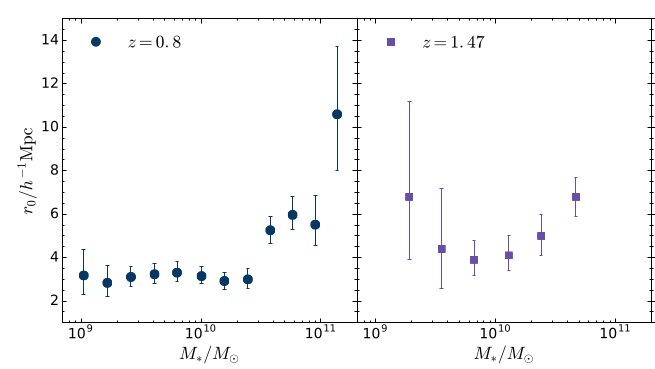 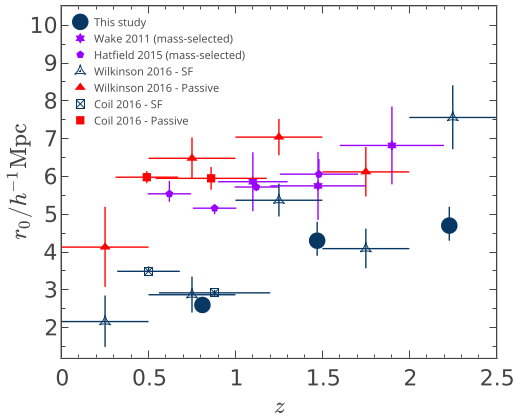

In [28]:
3/h

4.327755337564917

Now we can compute how many galaxies we can expect in 100 kpc around a "standard" galaxy with r0 = 4. For that we integrate the 2ptcf on a cylinder and we multiply it by the average density of galaxies of M*>M. to obtain this density we need to integrate the galaxy mass functino above M. For that we use the standard mass function from Tinker08:

In [29]:
def rho(Mass, z = 1):
    lnM=np.arange(Mass, 15.5, 0.1)
    M = 10**lnM
    mfunc = mass_function.massFunction(M, z, mdef = '200m', model = 'tinker08', q_out = 'dndlnM')
    #mfunc2 = mass_function.massFunction(M, 1.0, mdef = 'vir', model = 'tinker08', q_out = 'dndlnM')
    #plt.loglog(M,mfunc,label='200m')
    #plt.loglog(M,mfunc2,label='mvir')
    #plt.ylabel(r'$({\rm Mpc}/h)^{-3}$')
    #print(np.sum(mfunc*lnM)*0.1*h**3 /u.Mpc**3) #Mpc^3)
    # dlog(M) = dln(M)/ln(10)
    rho_tot=np.sum(mfunc)*np.log(10)*0.1/h**3/u.Mpc**3; 
    return rho_tot

In [30]:
def Adelberger(r, rz, r0, gamma, rho):
	"""
	compute the expected number of galaxies at a radius r from an overdensity (1+ (r/r0)^-gamma) and in a redshift range [-dz; dz].
	Taken from Adelberger et al. 2003
	"""
	x = rz**2/(rz**2 + r**2)
	w = r0**gamma*r**(1-gamma)*special.beta(0.5, (gamma - 1)/2)*special.betainc(0.5, (gamma - 1)/2, x)/(2*rz)
	n_exp = rho*2*np.pi*r*rz*2 # the last factor 2 is to take into account that the cylinder span on [-rz, +rz]
	return n_exp*(w+1)

def get_expected_group_density(z, r0, Radius = 100, dv = 1e6, Mh_min = 11):
	"""
	Get the number of galaxies that we can expect in a group/cluster of parameter r0 within a given radius, in a given redshift slice
	(Outside of a group, r0 = 0) and located at redshift Z.
	In other words the 2 points correlation function is integrated over a cylinder along the LOS
	(the circular section is orthogonal to the LOS, and the depth of the cylinder is along the redshifts)
	"""
	from scipy.integrate import quad, dblquad
	
	H = cosmo.H(z).to(u.m/u.kpc/u.s)
	#dz = dv*Z/const.c.value
	#rz = C.value*dz/H.value
	rz = dv/H.value
	rhoU = ((rho(Mh_min, z)).to(u.kpc**(-3))).value
	#print("n = ", rhoU)
	#print("Z = ", Z, "      rz = ", rz)
	#return dblquad(f, 0, Radius, lambda r: 0, lambda r: dz, args = (r0, 1.77, rhoU, H))
	N = quad(Adelberger, 0, Radius, args = (rz, r0, 1.77, rhoU))
	Nu = quad(Adelberger, 0, Radius, args = (rz, 0, 1.77, rhoU))
	N = N[0]
	Nu = Nu[0]
	
	# uncertainties
	gamma = 1.77
	J2 = 72/((3-gamma)*(4-gamma)*(6-gamma)*2**gamma)
	#J2 = 4.87
	Nexp = Nu
	Nobs = N
	V2pt = Nexp**2*((r0/Radius)**gamma)*J2
	Vsn = Nobs
	N_sigma = (Vsn + V2pt)**0.5
	N_sigma_poiss = Vsn**0.5
	#print(N, Nu, V2pt, rz)
	
	return N, N_sigma, N_sigma_poiss

we can then get the Nb of halos:
- with logM*>9 (complete volume limited sample)
- with logM*>8(~ down to the lowest mass in MEGAFLOW)

For logM*>9:

In [34]:
Nexp_9, Nexp_9_err, Nexp_9_err_poiss = \
get_expected_group_density(z_median, 4e3, Radius = 100, dv = 1e6, Mh_min = gt.Behroozi_2019(9, z_median))
print("Nb of halos with logM*>9 expected in 100 kpc around a standard halo (r0=4Mpc): ", \
      np.round(Nexp_9,3), " pm ", np.round(Nexp_9_err_poiss,3))

Exception: Cosmology is not set.

For logM*>8:

In [171]:
Nexp_8, Nexp_8_err, Nexp_8_err_poiss = \
get_expected_group_density(z_median, 4e3, Radius = 100, dv = 1e6, Mh_min = gt.Behroozi_2019(8, z_median))
print("Nb of halos with logM*>8 expected in 100 kpc around a standard halo (r0=4Mpc): ", \
      np.round(Nexp_8,3), " pm ", np.round(Nexp_8_err,3))

Nb of halos with logM*>8 expected in 100 kpc around a standard halo (r0=4Mpc):  1.994  pm  3.209


**Now we can compare these figure with what we have in MEGAFLOW:**

For that we can first compute the number of neighbours around each galaxy in 100 kpc:
- for logM*>9

In [173]:
R_04_15_zconf1_9 = gt.get_Nxxx_neighb(R_04_15_zconf1_9, radius = 100)

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

The mean number of neighb around each galaxy with logM*>9 is :  0.523 pm 0.8502754374667205


Text(0.5, 0, 'N logM>9 in 100 kpc around logM>9')

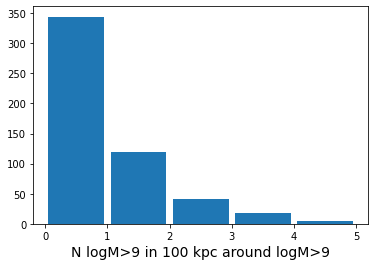

In [174]:
print("The mean number of neighb around each galaxy with logM*>9 is : ", \
      np.round(np.mean(R_04_15_zconf1_9["N100_neighb"]), 3), "pm", np.std(R_04_15_zconf1_9["N100_neighb"]))
plt.hist(R_04_15_zconf1_9["N100_neighb"], bins = 5, range = (0,5), rwidth = 0.9);
plt.xlabel("N logM>9 in 100 kpc around logM>9", size = 14)

This number is consistent with prediction but slightly underestimated. It could be because FoV crop the cylinder for some galaxies

- for all (logM*>8)

In [175]:
R_04_15_zconf1 = gt.get_Nxxx_neighb(R_04_15_zconf1, radius = 100)

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dist"] = Distance(unit=u.kpc, z = gal["Z"]).value/((1+gal["Z"])**2)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:917: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["neighb_dist"] = sep.radian*F["dist"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:916: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

The mean number of neighb around each galaxy with logM*>8 is :  0.65 pm 1.0625331132825593


Text(0.5, 0, 'N logM>8 in 100 kpc around logM*>8')

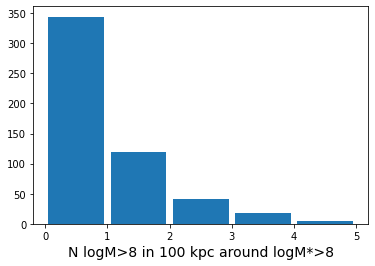

In [176]:
print("The mean number of neighb around each galaxy with logM*>8 is : ", \
      np.round(np.mean(R_04_15_zconf1["N100_neighb"]), 3), "pm", np.std(R_04_15_zconf1["N100_neighb"]))
plt.hist(R_04_15_zconf1_9["N100_neighb"], bins = 5, range = (0,5), rwidth = 0.9);
plt.xlabel("N logM>8 in 100 kpc around logM*>8", size = 14)

This number is significantly below expectation. It could be because FoV crop the cylinder as previously + uncomplete sample of loM*>8 galaxies.

**Now we can do the same thing for absorptions:**

In [180]:
Abs = pd.read_csv("MgII_all_absorption")
Abs = gt.get_Nxxx_abs(Abs, R_04_15_zconf1_9, bmax = 100, dv = 1e6)
Abs2 = gt.get_Nxxx_abs(Abs, R_04_15_zconf1, bmax = 100, dv = 1e6)

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:852: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dv_abs"] = np.abs(F["Z"] - absorption["z_abs"])*const.c.value/(1+absorption["z_abs"])
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:852: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dv_abs"] = np.abs(F["Z"] - absorption["z_abs"])*const.c.value/(1+absorption["z_abs"])
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:852: SettingWithCopyWarning: 
A value is tryin

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:852: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dv_abs"] = np.abs(F["Z"] - absorption["z_abs"])*const.c.value/(1+absorption["z_abs"])
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:852: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dv_abs"] = np.abs(F["Z"] - absorption["z_abs"])*const.c.value/(1+absorption["z_abs"])
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:852: SettingWithCopyWarning: 
A value is tryin

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:852: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dv_abs"] = np.abs(F["Z"] - absorption["z_abs"])*const.c.value/(1+absorption["z_abs"])
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:852: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F["dv_abs"] = np.abs(F["Z"] - absorption["z_abs"])*const.c.value/(1+absorption["z_abs"])
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:852: SettingWithCopyWarning: 
A value is tryin

The mean number of neighb with logM*>9 around each absorption is :  0.857 pm 0.9404008408634047


Text(0.5, 0, 'N logM>9 in 100 kpc around abs')

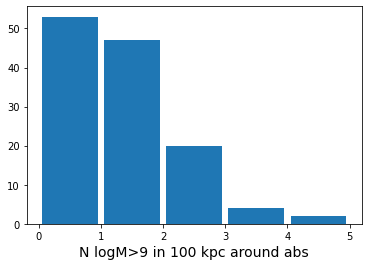

In [181]:
print("The mean number of neighb with logM*>9 around each absorption is : ", \
      np.round(np.mean(Abs["N100_abs"]), 3), "pm", np.std(Abs["N100_abs"]))
plt.hist(Abs["N100_abs"], bins = 5, range = (0,5), rwidth = 0.9);
plt.xlabel("N logM>9 in 100 kpc around abs", size = 14)

Which is a number **very close to what is obtained for a "standard" halo**

The mean number of neighb with logM*>8 around each absorption is :  1.0 pm 1.0690449676496976


Text(0.5, 0, 'N logM>8 in 100 kpc around abs')

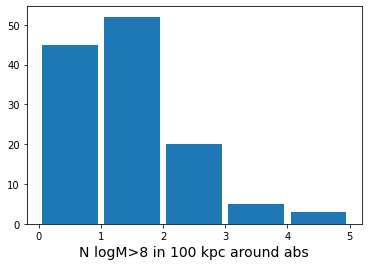

In [182]:
print("The mean number of neighb with logM*>8 around each absorption is : ", \
      np.round(np.mean(Abs2["N100_abs"]), 3), "pm", np.std(Abs2["N100_abs"]))
plt.hist(Abs2["N100_abs"], bins = 5, range = (0,5), rwidth = 0.9);
plt.xlabel("N logM>8 in 100 kpc around abs", size = 14)

Which is what is obtained for a "standard" halo but probably because incompletness issues

**Now we can do the same exercise within ~the full FOV** (radius = 280kpc)

- Expected for logM*>9:

In [411]:
Nexp_9, Nexp_9_err, Nexp_9_err_poiss = \
get_expected_group_density(z_median, 4e3, Radius = 280, dv = 1e6, Mh_min = gt.Behroozi_2019(9, z_median))
print("Nb of halos with logM*>9 expected in 100 kpc around a standard halo (r0=4Mpc): ", \
      np.round(Nexp_9,3), " pm ", np.round(Nexp_9_err_poiss,3))

Nb of halos with logM*>9 expected in 100 kpc around a standard halo (r0=4Mpc):  2.735  pm  1.654


- Expected for logM*>8:

In [195]:
Nexp_8, Nexp_8_err, Nexp_8_err_poiss = \
get_expected_group_density(z_median, 4e3, Radius = 280, dv = 1e6, Mh_min = gt.Behroozi_2019(8, z_median))
print("Nb of halos with logM*>8 expected in 280 kpc around a standard halo (r0=4Mpc): ", \
      np.round(Nexp_8,3), " pm ", np.round(Nexp_8_err,3))

Nb of halos with logM*>8 expected in 280 kpc around a standard halo (r0=4Mpc):  7.313  pm  9.476


**and we measure around each absorption in MEGAFLOW:**

In [415]:
Abs = pd.read_csv("MgII_all_absorption")
Abs = gt.get_Nxxx_abs(Abs, R_04_15_zconf1_9, bmax = 280, dv = 1e6)
Abs2 = gt.get_Nxxx_abs(Abs, R_04_15_zconf1, bmax = 280, dv = 1e6)

The mean number of neighb with logM*>9 around each absorption is :  1.952 pm 2.1301208806042897


Text(0.5, 0, 'N logM>9 in 280 kpc around abs')

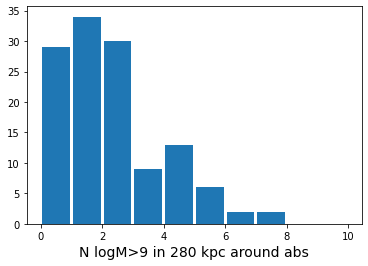

In [416]:
print("The mean number of neighb with logM*>9 around each absorption is : ", \
      np.round(np.mean(Abs["N280_abs"]), 3), "pm", np.std(Abs["N280_abs"]))
plt.hist(Abs["N280_abs"], bins = 10, range = (0,10), rwidth = 0.9);
plt.xlabel("N logM>9 in 280 kpc around abs", size = 14)

The mean number of neighb with logM*>9 in 280 kpc around each absorption is :  2.587 pm 2.688216028704095


Text(0.5, 0, 'N logM>8 in 280 kpc around abs')

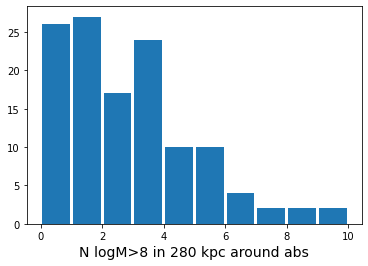

In [417]:
print("The mean number of neighb with logM*>9 in 280 kpc around each absorption is : ", \
      np.round(np.mean(Abs2["N280_abs"]), 3), "pm", np.std(Abs2["N280_abs"]))
plt.hist(Abs2["N280_abs"], bins = 10, range = (0,10), rwidth = 0.9);
plt.xlabel("N logM>8 in 280 kpc around abs", size = 14)

Significantly below what is expected, probably due to incompletness

**Finally we can compare those figure to what we would expect if an absorption would be associated with an overdensity, eg a massive halo log(Mh)~1e13**

It corresponds to a logM*~11, so a r0*h ~ 6-7 Mpc so a r0 ~ 8-10Mpc

In [201]:
gt.Behroozi_2019(10.9, z_median)

13.059596026756978

in 100 kpc we would expect:

In [410]:
Nexp_9, Nexp_9_err, Nexp_9_err_poiss = \
get_expected_group_density(z_median, 8e3, Radius = 100, dv = 1e6, Mh_min = gt.Behroozi_2019(9, z_median))
print("Nb of halos with logM*>9 expected in 100 kpc around a standard halo (r0=4Mpc): ", \
      np.round(Nexp_9,3), " pm ", np.round(Nexp_9_err_poiss,3))

Nb of halos with logM*>9 expected in 100 kpc around a standard halo (r0=4Mpc):  2.47  pm  1.572


**Significantly higher to what we find in MEGAFLOW**

and in the FOV we would expect:

In [412]:
Nexp_9, Nexp_9_err, Nexp_9_err_poiss = \
get_expected_group_density(z_median, 8e3, Radius = 280, dv = 1e6, Mh_min = gt.Behroozi_2019(9, z_median))
print("Nb of halos with logM*>9 expected in 100 kpc around a standard halo (r0=4Mpc): ", \
      np.round(Nexp_9,3), " pm ", np.round(Nexp_9_err_poiss,3))

Nb of halos with logM*>9 expected in 100 kpc around a standard halo (r0=4Mpc):  8.753  pm  2.958


**Also Significantly higher to what we find in MEGAFLOW**

### In conclusion
**The nb of galaxies around an absorption is approximately what is expected around a standard halo mass with the correlation function. MgII absorption are NOT associated with particularly massive halos. As we expect typically 2 +- 2 galaxies with logM*>9 around a standard halo, if we want to study overdensities (in Number, not in mass), we can select groups of stricly more than 4 galaxies.**

# FoF

We apply the FoF on the full sample of galaxies in 0.4 - 1.5 with zconf>0. We will do the seleciton on logM*>9 later

Knobel+09
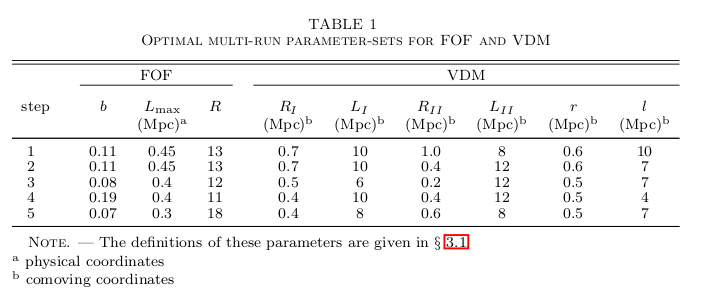!
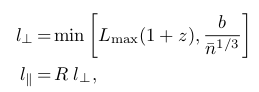
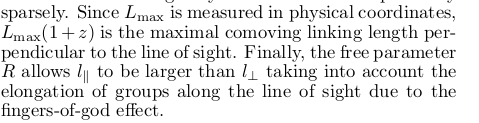

In [35]:
13*0.45*cosmo.H0

<Quantity 405.522 km / (Mpc s)>

In [36]:
# sligthly different from above because we do not require qso behind
R_04_15 = R[fzlow & fzhigh & fqso & fstar & fzconf_1] 

In [331]:
R_fof = gt.FoF(R_04_15, D0 = 450, V0 = 500) #Using the parameters of Huchra & Geller, tested on TNG100 at z = 1

iter:  1       nb of ungrouped =  960
Number of companions found:  1
         ID  group_id
2019  32081    -32081
iter:  2       nb of ungrouped =  959
Number of companions found:  2
         ID  group_id
2018  32080    -32080
2014  32076    -32076
Number of companions found:  3
         ID  group_id
2018  32080         2
2014  32076         2
1990  32051    -32051
Number of companions found:  2
         ID  group_id
2014  32076         2
1990  32051         2
iter:  3       nb of ungrouped =  956
Number of companions found:  1
         ID  group_id
2016  32078    -32078
iter:  4       nb of ungrouped =  955
Number of companions found:  2
         ID  group_id
2013  32075    -32075
2005  32067    -32067
Number of companions found:  2
         ID  group_id
2013  32075         4
2005  32067         4
iter:  5       nb of ungrouped =  953
Number of companions found:  1
         ID  group_id
2012  32074    -32074
iter:  6       nb of ungrouped =  952
Number of companions found:  1
         

Number of companions found:  1
         ID  group_id
1923  31100    -31100
iter:  34       nb of ungrouped =  895
Number of companions found:  1
         ID  group_id
1920  31097    -31097
iter:  35       nb of ungrouped =  894
Number of companions found:  1
         ID  group_id
1918  31095    -31095
iter:  36       nb of ungrouped =  893
Number of companions found:  2
         ID  group_id
1917  31094    -31094
1908  31085    -31085
Number of companions found:  2
         ID  group_id
1917  31094        36
1908  31085        36
iter:  37       nb of ungrouped =  891
Number of companions found:  2
         ID  group_id
1914  31091    -31091
1904  31081    -31081
Number of companions found:  2
         ID  group_id
1914  31091        37
1904  31081        37
iter:  38       nb of ungrouped =  889
Number of companions found:  1
         ID  group_id
1911  31088    -31088
iter:  39       nb of ungrouped =  888
Number of companions found:  1
         ID  group_id
1910  31087    -31087
ite

Number of companions found:  4
         ID  group_id
1756  29093        71
1744  29081        71
1741  29078        71
1734  29071        71
iter:  72       nb of ungrouped =  827
Number of companions found:  2
         ID  group_id
1755  29092    -29092
1678  29002    -29002
Number of companions found:  2
         ID  group_id
1755  29092        72
1678  29002        72
iter:  73       nb of ungrouped =  825
Number of companions found:  2
         ID  group_id
1751  29088    -29088
1747  29084    -29084
Number of companions found:  2
         ID  group_id
1751  29088        73
1747  29084        73
iter:  74       nb of ungrouped =  823
Number of companions found:  1
         ID  group_id
1749  29086    -29086
iter:  75       nb of ungrouped =  822
Number of companions found:  1
         ID  group_id
1746  29083    -29083
iter:  76       nb of ungrouped =  821
Number of companions found:  2
         ID  group_id
1743  29080    -29080
1738  29075    -29075
Number of companions found:  

Number of companions found:  1
         ID  group_id
1579  27102    -27102
iter:  114       nb of ungrouped =  762
Number of companions found:  1
         ID  group_id
1578  27101    -27101
iter:  115       nb of ungrouped =  761
Number of companions found:  7
         ID  group_id
1575  27098    -27098
1552  27074    -27074
1551  27073    -27073
1535  27056    -27056
1534  27055    -27055
1531  27052    -27052
1529  27050    -27050
Number of companions found:  7
         ID  group_id
1575  27098       115
1552  27074       115
1551  27073       115
1535  27056       115
1534  27055       115
1531  27052       115
1529  27050       115
Number of companions found:  7
         ID  group_id
1575  27098       115
1552  27074       115
1551  27073       115
1535  27056       115
1534  27055       115
1531  27052       115
1529  27050       115
Number of companions found:  8
         ID  group_id
1575  27098       115
1552  27074       115
1551  27073       115
1540  27062    -27062
1535  27

Number of companions found:  1
         ID  group_id
1469  26081    -26081
iter:  151       nb of ungrouped =  697
Number of companions found:  4
         ID  group_id
1467  26079    -26079
1464  26076    -26076
1462  26074    -26074
1461  26073    -26073
Number of companions found:  4
         ID  group_id
1467  26079       151
1464  26076       151
1462  26074       151
1461  26073       151
Number of companions found:  4
         ID  group_id
1467  26079       151
1464  26076       151
1462  26074       151
1461  26073       151
Number of companions found:  4
         ID  group_id
1467  26079       151
1464  26076       151
1462  26074       151
1461  26073       151
iter:  152       nb of ungrouped =  693
Number of companions found:  1
         ID  group_id
1465  26077    -26077
iter:  153       nb of ungrouped =  692
Number of companions found:  1
         ID  group_id
1463  26075    -26075
iter:  154       nb of ungrouped =  691
Number of companions found:  4
         ID  group_i

Number of companions found:  1
         ID  group_id
1294  24043    -24043
iter:  191       nb of ungrouped =  632
Number of companions found:  1
         ID  group_id
1291  24040    -24040
iter:  192       nb of ungrouped =  631
Number of companions found:  2
         ID  group_id
1289  24038    -24038
1288  24037    -24037
Number of companions found:  2
         ID  group_id
1289  24038       192
1288  24037       192
iter:  193       nb of ungrouped =  629
Number of companions found:  1
         ID  group_id
1285  24034    -24034
iter:  194       nb of ungrouped =  628
Number of companions found:  4
         ID  group_id
1262  23161    -23161
1260  23159    -23159
1247  23145    -23145
1231  23129    -23129
Number of companions found:  4
         ID  group_id
1262  23161       194
1260  23159       194
1247  23145       194
1231  23129       194
Number of companions found:  4
         ID  group_id
1262  23161       194
1260  23159       194
1247  23145       194
1231  23129       19

Number of companions found:  9
         ID  group_id
1251  23149       201
1246  23144       201
1239  23137       201
1215  23113       201
1212  23110       201
1206  23104       201
1203  23101       201
1168  23050       201
1162  23037       201
Number of companions found:  9
         ID  group_id
1251  23149       201
1246  23144       201
1239  23137       201
1215  23113       201
1212  23110       201
1206  23104       201
1203  23101       201
1168  23050       201
1162  23037       201
Number of companions found:  9
         ID  group_id
1251  23149       201
1246  23144       201
1239  23137       201
1215  23113       201
1212  23110       201
1206  23104       201
1203  23101       201
1168  23050       201
1162  23037       201
Number of companions found:  9
         ID  group_id
1251  23149       201
1246  23144       201
1239  23137       201
1215  23113       201
1212  23110       201
1206  23104       201
1203  23101       201
1168  23050       201
1162  23037       

Number of companions found:  21
         ID  group_id
1143  22100       221
1134  22090       221
1133  22089       221
1128  22084       221
1126  22082       221
1119  22075       221
1118  22074       221
1117  22073       221
1116  22072       221
1115  22071       221
1111  22067       221
1109  22065       221
1108  22064       221
1106  22062       221
1103  22059       221
1102  22058       221
1099  22055       221
1098  22054       221
1096  22052       221
1094  22050       221
1086  22042       221
Number of companions found:  21
         ID  group_id
1143  22100       221
1134  22090       221
1133  22089       221
1128  22084       221
1126  22082       221
1119  22075       221
1118  22074       221
1117  22073       221
1116  22072       221
1115  22071       221
1111  22067       221
1109  22065       221
1108  22064       221
1106  22062       221
1103  22059       221
1102  22058       221
1099  22055       221
1098  22054       221
1096  22052       221
1094  22050 

Number of companions found:  2
         ID  group_id
1097  22053       240
1091  22047       240
iter:  241       nb of ungrouped =  509
Number of companions found:  1
         ID  group_id
1095  22051    -22051
iter:  242       nb of ungrouped =  508
Number of companions found:  2
         ID  group_id
1093  22049    -22049
1088  22044    -22044
Number of companions found:  2
         ID  group_id
1093  22049       242
1088  22044       242
iter:  243       nb of ungrouped =  506
Number of companions found:  1
         ID  group_id
1090  22046    -22046
iter:  244       nb of ungrouped =  505
Number of companions found:  3
         ID  group_id
1049  21135    -21135
1032  21116    -21116
1004  21088    -21088
Number of companions found:  2
         ID  group_id
1049  21135       244
1032  21116       244
Number of companions found:  3
         ID  group_id
1049  21135       244
1015  21099    -21099
1004  21088       244
Number of companions found:  2
         ID  group_id
1015  21099

Number of companions found:  2
        ID  group_id
939  20081    -20081
926  20068    -20068
Number of companions found:  2
        ID  group_id
939  20081       276
926  20068       276
iter:  277       nb of ungrouped =  443
Number of companions found:  4
        ID  group_id
938  20080    -20080
920  20062    -20062
904  20044    -20044
875  20007    -20007
Number of companions found:  4
        ID  group_id
938  20080       277
920  20062       277
904  20044       277
875  20007       277
Number of companions found:  4
        ID  group_id
938  20080       277
920  20062       277
904  20044       277
875  20007       277
Number of companions found:  4
        ID  group_id
938  20080       277
920  20062       277
904  20044       277
875  20007       277
iter:  278       nb of ungrouped =  439
Number of companions found:  1
        ID  group_id
935  20077    -20077
iter:  279       nb of ungrouped =  438
Number of companions found:  2
        ID  group_id
934  20076    -20076
92

Number of companions found:  5
        ID  group_id
822  19058       321
820  19056       321
819  19055       321
792  19004       321
791  19003       321
Number of companions found:  5
        ID  group_id
822  19058       321
820  19056       321
819  19055       321
792  19004       321
791  19003       321
Number of companions found:  5
        ID  group_id
822  19058       321
820  19056       321
819  19055       321
792  19004       321
791  19003       321
Number of companions found:  5
        ID  group_id
822  19058       321
820  19056       321
819  19055       321
792  19004       321
791  19003       321
iter:  322       nb of ungrouped =  369
Number of companions found:  1
        ID  group_id
803  19021    -19021
iter:  323       nb of ungrouped =  368
Number of companions found:  1
        ID  group_id
788  18097    -18097
iter:  324       nb of ungrouped =  367
Number of companions found:  15
        ID  group_id
787  18096    -18096
786  18095    -18095
776  18084 

Number of companions found:  1
        ID  group_id
755  18063    -18063
iter:  339       nb of ungrouped =  329
Number of companions found:  1
        ID  group_id
747  18054    -18054
iter:  340       nb of ungrouped =  328
Number of companions found:  1
        ID  group_id
746  18053    -18053
iter:  341       nb of ungrouped =  327
Number of companions found:  1
        ID  group_id
743  18050    -18050
iter:  342       nb of ungrouped =  326
Number of companions found:  1
        ID  group_id
742  18049    -18049
iter:  343       nb of ungrouped =  325
Number of companions found:  1
        ID  group_id
732  18026    -18026
iter:  344       nb of ungrouped =  324
Number of companions found:  1
        ID  group_id
730  18024    -18024
iter:  345       nb of ungrouped =  323
Number of companions found:  1
        ID  group_id
711  17104    -17104
iter:  346       nb of ungrouped =  322
Number of companions found:  4
        ID  group_id
710  17103    -17103
682  17075    -17075
68

Number of companions found:  2
        ID  group_id
622  16110    -16110
588  16076    -16076
Number of companions found:  2
        ID  group_id
622  16110       378
588  16076       378
iter:  379       nb of ungrouped =  258
Number of companions found:  1
        ID  group_id
621  16109    -16109
iter:  380       nb of ungrouped =  257
Number of companions found:  2
        ID  group_id
620  16108    -16108
583  16070    -16070
Number of companions found:  2
        ID  group_id
620  16108       380
583  16070       380
iter:  381       nb of ungrouped =  255
Number of companions found:  1
        ID  group_id
616  16104    -16104
iter:  382       nb of ungrouped =  254
Number of companions found:  4
        ID  group_id
615  16103    -16103
613  16101    -16101
600  16088    -16088
573  16051    -16051
Number of companions found:  3
        ID  group_id
615  16103       382
613  16101       382
573  16051       382
Number of companions found:  3
        ID  group_id
615  16103     

Number of companions found:  2
        ID  group_id
448  14121       417
423  14080       417
iter:  418       nb of ungrouped =  191
Number of companions found:  1
        ID  group_id
463  14137    -14137
iter:  419       nb of ungrouped =  190
Number of companions found:  9
        ID  group_id
462  14136    -14136
459  14133    -14133
457  14131    -14131
435  14108    -14108
433  14105    -14105
432  14104    -14104
430  14102    -14102
429  14101    -14101
427  14098    -14098
Number of companions found:  9
        ID  group_id
462  14136       419
459  14133       419
457  14131       419
435  14108       419
433  14105       419
432  14104       419
430  14102       419
429  14101       419
427  14098       419
Number of companions found:  9
        ID  group_id
462  14136       419
459  14133       419
457  14131       419
435  14108       419
433  14105       419
432  14104       419
430  14102       419
427  14098       419
422  14079    -14079
Number of companions found:  2

Number of companions found:  2
        ID  group_id
335  13109    -13109
325  13099    -13099
Number of companions found:  2
        ID  group_id
335  13109       445
325  13099       445
iter:  446       nb of ungrouped =  130
Number of companions found:  2
        ID  group_id
333  13107    -13107
293  13061    -13061
Number of companions found:  2
        ID  group_id
333  13107       446
293  13061       446
iter:  447       nb of ungrouped =  128
Number of companions found:  2
        ID  group_id
331  13105    -13105
314  13088    -13088
Number of companions found:  2
        ID  group_id
331  13105       447
314  13088       447
iter:  448       nb of ungrouped =  126
Number of companions found:  1
        ID  group_id
328  13102    -13102
iter:  449       nb of ungrouped =  125
Number of companions found:  4
        ID  group_id
323  13097    -13097
311  13085    -13085
304  13078    -13078
301  13075    -13075
Number of companions found:  5
        ID  group_id
323  13097     

Number of companions found:  7
        ID  group_id
161  11186       480
154  11178    -11178
90   11113    -11113
89   11112       480
77   11100       480
73   11096       480
22   11023       480
Number of companions found:  4
        ID  group_id
154  11178       480
90   11113       480
89   11112       480
77   11100       480
Number of companions found:  6
        ID  group_id
154  11178       480
90   11113       480
89   11112       480
77   11100       480
73   11096       480
22   11023       480
Number of companions found:  5
        ID  group_id
161  11186       480
92   11115       480
85   11108       480
73   11096       480
22   11023       480
Number of companions found:  7
        ID  group_id
161  11186       480
154  11178       480
90   11113       480
89   11112       480
77   11100       480
73   11096       480
22   11023       480
Number of companions found:  8
        ID  group_id
161  11186       480
92   11115       480
90   11113       480
89   11112      

In [332]:
#R_fof.to_csv("R_fof_450_500_manuscript.csv", index = False)
R_fof = pd.read_csv("R_fof_450_500_manuscript.csv", index_col = False)

In [333]:
G_fof = gt.get_groups(R_fof, N_min = 1)
G3_fof = gt.get_groups(R_fof, N_min = 3)
G4_fof = gt.get_groups(R_fof, N_min = 4)
G5_fof = gt.get_groups(R_fof, N_min = 5)

we compute the mass with **all** galaxies (including low mass):

In [334]:
R_fof, G_fof = gt.calc_mass(R_fof, G_fof, N_lim = 3)

In [335]:
print("N of group of more than 3 galaxies: ", len(G3_fof))
print("N of group of more than 4 galaxies: ", len(G4_fof))
print("N of group of more than 5 galaxies: ", len(G5_fof))

N of group of more than 3 galaxies:  98
N of group of more than 4 galaxies:  55
N of group of more than 5 galaxies:  29


In [336]:
sigma2_err =  10**R_fof["sed_logMass_u95"] - 10**R_fof["sed_logMass"]
sigma1_err = sigma2_err/2
R_fof["mass10_err"] = sigma1_err

In [337]:
G_fof = gt.calc_mass_ratio(G_fof, R_fof)
G_fof = gt.recompute_centers_new(G_fof, R_fof)

In [338]:
#R_fof = gt.match_qso(R_fof, fields_info)
G_fof = gt.match_qso(G_fof, fields_info)
len(G_fof["group_id"])

515

In [339]:
f1 = G_fof["Mvir_sigma2"]>=1e12
f2 = G_fof["Mvir_sigma2"]>=1e13
f3 = G_fof["mean_z"]>=0.3
f4 = G_fof["mean_z"]<=1.5
print("Number of groups with mass above 1e12 Msun: ", len(G_fof[f1 & f3 & f4]))
print("Number of groups with mass above 1e13 Msun: ", len(G_fof[f2 & f3 & f4]))

Number of groups with mass above 1e12 Msun:  67
Number of groups with mass above 1e13 Msun:  22


# Hom

In [772]:
G_hom = G_fof.copy()
R_hom = R_fof.copy()

0
------------- GROUP ID:  221
############# N =  4
##################    N =  4
 M* ====  11.141338586807251
closest match =  11.141337590202054
11.141337590202054 11.141338586807251 11.141389944966697
slope =  2.292077919373132


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.176393036300347
closest match =  11.17640404407504
11.17635362315529 11.176393036300347 11.17640404407504
slope =  2.3799883184825386


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.19583469773149
closest match =  11.195841970146413
11.195792426642681 11.19583469773149 11.195841970146413
slope =  2.422137938846364
PLOT PLOT PLOT
 M* ====  11.237202069002523
closest match =  11.237191584426256
11.237191584426256 11.237202069002523 11.237239653610525
slope =  2.4964268031431294
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.335898940923135
closest match =  11.335891248799692
11.335891248799692 11.335898940923135 11.335937344524549
slope =  2.603304327778794
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.344318834538422
closest match =  11.34431754044701
11.34431754044701 11.344318834538422 11.34436353615046
slope =  2.6089654252352115
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.351442214230241
closest match =  11.351440753981427
11.351440753981427 11.351442214230241 11.35148667110672
slope =  2.613430158040302
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.368808510861006
closest match =  11.368810158784072
11.368764412014995 11.368808510861006 11.368810158784072
slope =  2.623162300487247
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.370024090125598
closest match =  11.370045165774878
11.369999430111077 11.370024090125598 11.370045165774878
slope =  2.6237992420062017
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.372395828593707
closest match =  11.372377146639085
11.372377146639085 11.372395828593707 11.372422861288037
slope =  2.6250053924394465
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.423456059113091
closest match =  11.423454931405367
11.423454931405367 11.423456059113091 11.423500293523386
slope =  2.6454055774193583
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.431109766627076
closest match =  11.431117779429295
11.431072456467414 11.431109766627076 11.431117779429295
slope =  2.6476910385026255
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.43167397142404
closest match =  11.431661637500023
11.431661637500023 11.43167397142404 11.431706957552969
slope =  2.6478609845080703
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.436108653803196
closest match =  11.436101957498833
11.436101957498833 11.436108653803196 11.436147256159552
slope =  2.6491114330470125
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.438020041028137
closest match =  11.438004318531547
11.438004318531547 11.438020041028137 11.43804960830774
slope =  2.6496311110399073
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.505329560014435
closest match =  11.505342825554159
11.505297763529969 11.505329560014435 11.505342825554159
slope =  2.663022848386569
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.507164935561617
closest match =  11.50714521897781
11.50714521897781 11.507164935561617 11.507190276638518
slope =  2.6632807412811217
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.509234849454415
closest match =  11.509217762969435
11.509217762969435 11.509234849454415 11.509262815829208
slope =  2.6635645464685536
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.51456784478217
closest match =  11.514578340751052
11.514533299762645 11.51456784478217 11.514578340751052
slope =  2.664266577058677
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.51456784478217
closest match =  11.514578340751052
11.514533299762645 11.51456784478217 11.514578340751052
slope =  2.664266577058677
PLOT PLOT PLOT
1
------------- GROUP ID:  324
############# N =  4
##################    N =  4
 M* ====  10.985515117645264
closest match =  10.98549956523652
10.98549956523652 10.985515117645264 10.985565878049966
slope =  1.809623114666613


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1903: RuntimeWarning: More than 20 figures h

 M* ====  11.0379696992245
closest match =  11.037989745927504
11.037929715006394 11.0379696992245 11.037989745927504
slope =  1.9989898171379343


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.037973678578933
closest match =  11.037989745927504
11.037929715006394 11.037973678578933 11.037989745927504
slope =  1.9989898171379343
PLOT PLOT PLOT
 M* ====  11.230483760143407
closest match =  11.230496243593546
11.23044859943777 11.230483760143407 11.230496243593546
slope =  2.518697163515093
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.340741241395506
closest match =  11.340722081320102
11.340722081320102 11.340741241395506 11.340767653513327
slope =  2.633210989480974
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.341312912944133
closest match =  11.341314481468704
11.341268915172714 11.341312912944133 11.341314481468704
slope =  2.633551782189871
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.346497273252837
closest match =  11.346505880365154
11.346460368548648 11.346497273252837 11.346505880365154
slope =  2.6367042501265345
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.366376035377224
closest match =  11.366398048742088
11.36635272228572 11.366376035377224 11.366398048742088
slope =  2.647486912231275
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.368715781136721
closest match =  11.368709193768913
11.368709193768913 11.368715781136721 11.368754500528524
slope =  2.6486378862750812
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.37574964581426
closest match =  11.375727374008086
11.375727374008086 11.37574964581426 11.37577262469792
slope =  2.651919792898821
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.382774817435713
closest match =  11.382782353961097
11.382737155589993 11.382774817435713 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.382776616342229
closest match =  11.382782353961097
11.382737155589993 11.382776616342229 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.38277841524129
closest match =  11.382782353961097
11.382737155589993 11.38277841524129 11.382782353961097
slope =  2.6549894848170856
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.383153429053163
closest match =  11.38314392920934
11.38314392920934 11.383153429053163 11.383189124652475
slope =  2.6551614872255986
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.394969206445683
closest match =  11.3949744545673
11.394929339107053 11.394969206445683 11.3949744545673
slope =  2.659868686982387
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.405936402036138
closest match =  11.405929249133269
11.405929249133269 11.405936402036138 11.405974297811342
slope =  2.6638117952834732
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.405936402036138
closest match =  11.405929249133269
11.405929249133269 11.405936402036138 11.405974297811342
slope =  2.6638117952834732
PLOT PLOT PLOT
2
------------- GROUP ID:  480
############# N =  4
##################    N =  4
 M* ====  11.193827390670776
closest match =  11.193803818028886
11.193803818028886 11.193827390670776 11.193851281828819
slope =  2.528267862731112


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.249740337621505
closest match =  11.249751519055403
11.249705602209085 11.249740337621505 11.249751519055403
slope =  2.613446036387439


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.25623442340213
closest match =  11.256216178531568
11.256216178531568 11.25623442340213 11.256261960401359
slope =  2.621151136092269
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.371396583716061
closest match =  11.371412770026767
11.371368397766947 11.371396583716061 11.371412770026767
slope =  2.7044193939569863
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.372150822739899
closest match =  11.372167053512712
11.37212268623927 11.372150822739899 11.372167053512712
slope =  2.704723340123623
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.395397417975571
closest match =  11.395378283916285
11.395378283916285 11.395397417975571 11.395422514490905
slope =  2.713082546290721
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.411561346746684
closest match =  11.411552058010336
11.411552058010336 11.411561346746684 11.41159621063422
slope =  2.717872449171726
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.414542788534746
closest match =  11.4145539944877
11.41450985479839 11.414542788534746 11.4145539944877
slope =  2.718668887000208
PLOT PLOT PLOT
END: Psat max =  0.47254813622253367
3
------------- GROUP ID:  196
############# N =  4
##################    N =  4
 M* ====  10.705596446990967
closest match =  10.705549756534218
10.705549756534218 10.705596446990967 10.705657275697929
slope =  1.116091270334892


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.767445525050677
closest match =  10.76743691894666
10.76743691894666 10.767445525050677 10.767533163844202
slope =  1.2468318121243118


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.768979386287171
closest match =  10.768974739963072
10.768974739963072 10.768979386287171 10.769070705378574
slope =  1.2504629858955567
PLOT PLOT PLOT
 M* ====  10.768986778955613
closest match =  10.768974739963072
10.768974739963072 10.768986778955613 10.769070705378574
slope =  1.2504629858955567
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.808915020413682
closest match =  10.808946388787609
10.808857611823523 10.808915020413682 10.808946388787609
slope =  1.3517155181780514
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.833613395579562
closest match =  10.833617598233781
10.833533176738294 10.833613395579562 10.833617598233781
slope =  1.4214531419955354
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.948674027713475
closest match =  10.948698339779035
10.948632245260292 10.948674027713475 10.948698339779035
slope =  1.8155998756751113
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.949141536769528
closest match =  10.949160744490033
10.94909471417917 10.949141536769528 10.949160744490033
slope =  1.8173653651217947
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.949146419247958
closest match =  10.949160744490033
10.94909471417917 10.949146419247958 10.949160744490033
slope =  1.8173653651217947
PLOT PLOT PLOT
END: Psat max =  0.0005941485465287277
4
------------- GROUP ID:  419
############# N =  4
##################    N =  4
 M* ====  10.775380849838257
closest match =  10.775377118724357
10.775377118724357 10.775380849838257 10.77546869969607
slope =  1.3103289664761875


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.849906930980758
closest match =  10.849933277959247
10.849854918627427 10.849906930980758 10.849933277959247
slope =  1.531421940755284


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.049750771765705
closest match =  11.049766405855028
11.049714253506014 11.049750771765705 11.049766405855028
slope =  2.3009740171113755
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.051227984481345
closest match =  11.051224935026848
11.051224935026848 11.051227984481345 11.051276963584446
slope =  2.3064487187687255
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.05354065348879
closest match =  11.053562044225854
11.053510200723707 11.05354065348879 11.053562044225854
slope =  2.3146815906157436
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.056947292032302
closest match =  11.05692301004763
11.05692301004763 11.056947292032302 11.056974582115297
slope =  2.326864239500733
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.057514449028421
closest match =  11.057490079949321
11.057490079949321 11.057514449028421 11.057541607484866
slope =  2.328875207021207
PLOT PLOT PLOT
END: Psat max =  2.755666885789765e-07
5
------------- GROUP ID:  201
############# N =  4
##################    N =  4
 M* ====  11.585887670516968
closest match =  11.58590167601199
11.585857380875671 11.585887670516968 11.58590167601199
slope =  2.7091281342963485


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.689428873269868
closest match =  11.689430869982752
11.689386631081245 11.689428873269868 11.689430869982752
slope =  2.712571875037959


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.689429761151342
closest match =  11.689430869982752
11.689386631081245 11.689429761151342 11.689430869982752
slope =  2.712571875037959
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.689430649031
closest match =  11.689430869982752
11.689386631081245 11.689430649031 11.689430869982752
slope =  2.712571875037959
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.691444891506006
closest match =  11.691465844891153
11.691421606607175 11.691444891506006 11.691465844891153
slope =  2.7126097402538685
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.695146858450245
closest match =  11.695137576721686
11.695137576721686 11.695146858450245 11.69518181391049
slope =  2.712676895983753
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.69514773471837
closest match =  11.695137576721686
11.695137576721686 11.69514773471837 11.69518181391049
slope =  2.712676895983753
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.69514773471837
closest match =  11.695137576721686
11.695137576721686 11.69514773471837 11.69518181391049
slope =  2.712676895983753
PLOT PLOT PLOT
6
------------- GROUP ID:  115
############# N =  4
##################    N =  4
 M* ====  10.723617315292357
closest match =  10.723576156548615
10.723576156548615 10.723617315292357 10.723676368738042
slope =  1.1974710930683359


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.036316030389639
closest match =  11.036289977181191
11.036289977181191 11.036316030389639 11.036342592665612
slope =  2.280720235349909


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.139077756185783
closest match =  11.139088954850294
11.139042780065427 11.139077756185783 11.139088954850294
slope =  2.5988469758875015
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.141280613577237
closest match =  11.141303124228148
11.141257039761419 11.141280613577237 11.141303124228148
slope =  2.603940297607602
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.141283750487746
closest match =  11.141303124228148
11.141257039761419 11.141283750487746 11.141303124228148
slope =  2.603940297607602
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.146701264819935
closest match =  11.146682367787756
11.146682367787756 11.146701264819935 11.146728238043927
slope =  2.616100497971286
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.146701264819935
closest match =  11.146682367787756
11.146682367787756 11.146701264819935 11.146728238043927
slope =  2.616100497971286
PLOT PLOT PLOT
7
------------- GROUP ID:  8
############# N =  4
##################    N =  4
 M* ====  10.978548884391783
closest match =  10.97857078495593
10.978489848339212 10.978548884391783 10.97857078495593
slope =  1.4826564894388214


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.25273607446993
closest match =  11.252744498597348
11.252691373595251 11.25273607446993 11.252744498597348
slope =  2.258846028702054


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.303581103784968
closest match =  11.30357097285731
11.30357097285731 11.303581103784968 11.303622136898786
slope =  2.345420661599974
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.303583262533863
closest match =  11.30357097285731
11.30357097285731 11.303583262533863 11.303622136898786
slope =  2.345420661599974
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.304403215543925
closest match =  11.304389404112982
11.304389404112982 11.304403215543925 11.304440542398284
slope =  2.3466019499927993
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.304403215543925
closest match =  11.304389404112982
11.304389404112982 11.304403215543925 11.304440542398284
slope =  2.3466019499927993
PLOT PLOT PLOT
8
------------- GROUP ID:  271
############# N =  4
##################    N =  4
 M* ====  10.158390164375305
closest match =  10.158362069240368
10.158362069240368 10.158390164375305 10.158549981163974
slope =  0.6386034356461475


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.353461140660263
closest match =  10.353404111051042
10.353404111051042 10.353461140660263 10.353571149084221
slope =  0.7184064474859635


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.389238431793798
closest match =  10.389164677948264
10.389164677948264 10.389238431793798 10.389327192590892
slope =  0.7384023868289445
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.39409396607068
closest match =  10.394030942340141
10.394030942340141 10.39409396607068 10.394192823931835
slope =  0.7412899685127697
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.39409396607068
closest match =  10.394030942340141
10.394030942340141 10.39409396607068 10.394192823931835
slope =  0.7412899685127697
PLOT PLOT PLOT
9
------------- GROUP ID:  440
############# N =  4
##################    N =  4
 M* ====  9.866744697093962
closest match =  9.866673564251792
9.866673564251792 9.866744697093962 9.86687800888647
slope =  0.5869618452083527


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.871601599058359
closest match =  9.87157677457252
9.87157677457252 9.871601599058359 9.871780917881308
slope =  0.5878282306935346


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.872253300566108
closest match =  9.872189166687901
9.872189166687901 9.872253300566108 9.872393272178156
slope =  0.5879371488817363
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.003408645410705
closest match =  10.003388085962102
10.003388085962102 10.003408645410705 10.003583076179956
slope =  0.6154216418280247
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.003408645410705
closest match =  10.003388085962102
10.003388085962102 10.003408645410705 10.003583076179956
slope =  0.6154216418280247
PLOT PLOT PLOT
10
------------- GROUP ID:  20
############# N =  4
##################    N =  4
 M* ====  10.686725854873655
closest match =  10.686729324768876
10.686605184484552 10.686725854873655 10.686729324768876
slope =  0.9666580084221941


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.728997658629483
closest match =  10.729017877612005
10.728900991138058 10.728997658629483 10.729017877612005
slope =  1.0266474465455635


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.73574848048069
closest match =  10.735762715928988
10.735647000150557 10.73574848048069 10.735762715928988
slope =  1.0370340297439078
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.746766448610442
closest match =  10.746778196031379
10.746664398544048 10.746766448610442 10.746778196031379
slope =  1.0545153748879887
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.746766448610442
closest match =  10.746778196031379
10.746664398544048 10.746766448610442 10.746778196031379
slope =  1.0545153748879887
PLOT PLOT PLOT
11
------------- GROUP ID:  383
############# N =  4
##################    N =  4
 M* ====  9.329996943473816
closest match =  9.329963808634982
9.329963808634982 9.329996943473816 9.330191620313185
slope =  0.5267561389228184


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.690393446002151
closest match =  9.690483294202345
9.690266579128403 9.690393446002151 9.690483294202345
slope =  0.5537279794574845


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.76114160046633
closest match =  9.761056904947246
9.761056904947246 9.76114160046633 9.761270457888557
slope =  0.5619271702598365
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.786634078119965
closest match =  9.78660980614885
9.78660980614885 9.786634078119965 9.78682211637734
slope =  0.5652162915763929
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.786634078119965
closest match =  9.78660980614885
9.78660980614885 9.786634078119965 9.78682211637734
slope =  0.5652162915763929
PLOT PLOT PLOT
12
------------- GROUP ID:  348
############# N =  4
##################    N =  4
 M* ====  10.576167345046995
closest match =  10.576131722932507
10.576131722932507 10.576167345046995 10.57625345020276
slope =  0.9858201844497098
BREAK:  3 candidates kept
13
------------- GROUP ID:  45
############# N =  4
##################    N =  4


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.888729810714722
closest match =  10.888739456721382
10.88865762275437 10.888729810714722 10.888739456721382
slope =  1.4663984210020076


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.007512420749078
closest match =  11.007521986861162
11.007457598796778 11.007512420749078 11.007521986861162
slope =  1.8637180844137944
 M* ====  11.007516689194732
closest match =  11.007521986861162
11.007457598796778 11.007516689194732 11.007521986861162
slope =  1.8637180844137944
PLOT PLOT PLOT
END: Psat max =  0.19898029990486377
14
------------- GROUP ID:  273
############# N =  4
##################    N =  4
 M* ====  10.697511553764343
closest match =  10.697502469694829
10.697502469694829 10.697511553764343 10.697613694451594
slope =  1.0789072819946102


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.800124515784216
closest match =  10.800111001143918
10.800111001143918 10.800124515784216 10.800203714970314
slope =  1.2943182767510315


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.802161032712462
closest match =  10.802146881611627
10.802146881611627 10.802161032712462 10.802239231589724
slope =  1.2994177419931998
PLOT PLOT PLOT
END: Psat max =  0.06347054797137242
15
------------- GROUP ID:  162
############# N =  4
##################    N =  4
 M* ====  9.81411498785019
closest match =  9.81408756112391
9.81408756112391 9.81411498785019 9.814303410417205
slope =  0.5559490058174655


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.030746462342405
closest match =  10.030779072475648
10.030575616706084 10.030746462342405 10.030779072475648
slope =  0.5898146819372431


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.236830275362667
closest match =  10.236746774119482
10.236746774119482 10.236830275362667 10.236933458584618
slope =  0.6428022809807089
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.236855448737886
closest match =  10.236933458584618
10.236746774119482 10.236855448737886 10.236933458584618
slope =  0.6428022809807089
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.236855448737886
closest match =  10.236933458584618
10.236746774119482 10.236855448737886 10.236933458584618
slope =  0.6428022809807089
PLOT PLOT PLOT
16
------------- GROUP ID:  88
############# N =  4
##################    N =  4
 M* ====  10.95026159286499
closest match =  10.950239926501347
10.950239926501347 10.95026159286499 10.950315712590424
slope =  1.583419879198203


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.171217899234447
closest match =  11.171229580281754
11.171177151799682 11.171217899234447 11.171229580281754
slope =  2.2888551274153075


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.375672763055507
closest match =  11.375683623368856
11.37563699521063 11.375672763055507 11.375683623368856
slope =  2.573577953303758
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.385573550783862
closest match =  11.385558302784872
11.385558302784872 11.385573550783862 11.385604833525699
slope =  2.5789660314824348
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.385573550783862
closest match =  11.385558302784872
11.385558302784872 11.385573550783862 11.385604833525699
slope =  2.5789660314824348
PLOT PLOT PLOT
17
------------- GROUP ID:  27
############# N =  4
##################    N =  4


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.14441704750061
closest match =  11.144393446826363
11.144393446826363 11.14441704750061 11.144442599708517
slope =  2.441386847628916


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.186759180340466
closest match =  11.186754945827056
11.186754945827056 11.186759180340466 11.186802290052658
slope =  2.5346533497495463


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.203360071503852
closest match =  11.203367461468346
11.203320669749758 11.203360071503852 11.203367461468346
slope =  2.564582016492839
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.203360071503852
closest match =  11.203367461468346
11.203320669749758 11.203360071503852 11.203367461468346
slope =  2.564582016492839
PLOT PLOT PLOT
18
------------- GROUP ID:  437
############# N =  4
##################    N =  4
 M* ====  10.115768790245056
closest match =  10.115752159089492
10.115752159089492 10.115768790245056 10.115938398425476
slope =  0.644338637591026


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.270190234239072
closest match =  10.270184318272287
10.270184318272287 10.270190234239072 10.270354298478784
slope =  0.7059716097913842


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.300866537054619
closest match =  10.300786034534651
10.300786034534651 10.300866537054619 10.300952301720486
slope =  0.7217371209328459
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.300866537054619
closest match =  10.300786034534651
10.300786034534651 10.300866537054619 10.300952301720486
slope =  0.7217371209328459
PLOT PLOT PLOT
19
------------- GROUP ID:  195
############# N =  4
##################    N =  4
 M* ====  10.49707567691803
closest match =  10.497130925648815
10.49697531717484 10.49707567691803 10.497130925648815
slope =  0.7711739402627674


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.702951995681522
closest match =  10.702935346078453
10.702935346078453 10.702951995681522 10.703058967266244
slope =  0.9707170927214479


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.717298425670487
closest match =  10.717257490917577
10.717257490917577 10.717298425670487 10.717378676694475
slope =  0.99022511622316
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.717298425670487
closest match =  10.717257490917577
10.717257490917577 10.717298425670487 10.717378676694475
slope =  0.99022511622316
PLOT PLOT PLOT
20
------------- GROUP ID:  141
############# N =  4
##################    N =  4
 M* ====  10.52265691757202
closest match =  10.522704964995512
10.522562115165988 10.52265691757202 10.522704964995512
slope =  0.8400514051214018


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.605433376223589
closest match =  10.60548909634532
10.605359571363632 10.605433376223589 10.60548909634532
slope =  0.9264714686672227
END: Psat max =  0.016970383651336185
21
------------- GROUP ID:  414
############# N =  4
##################    N =  4
 M* ====  10.49798059463501
closest match =  10.49801147679064
10.497860491612586 10.49798059463501 10.49801147679064
slope =  0.7947879491081812
BREAK: 

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 2 candidates kept
22
------------- GROUP ID:  481
############# N =  4
##################    N =  4
 M* ====  10.008962273597717
closest match =  10.008975636705769
10.00876988502678 10.008962273597717 10.008975636705769
slope =  0.5832331507641362


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.287084472730283
closest match =  10.287133249842025
10.286950385690545 10.287084472730283 10.287133249842025
slope =  0.65623141025964


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.294509525515785
closest match =  10.294432538615828
10.294432538615828 10.294509525515785 10.294614637975618
slope =  0.6589874898599849
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.294509525515785
closest match =  10.294432538615828
10.294432538615828 10.294509525515785 10.294614637975618
slope =  0.6589874898599849
PLOT PLOT PLOT
23
------------- GROUP ID:  245
############# N =  4
##################    N =  4
 M* ====  9.661369085311891
closest match =  9.661266498897184
9.661266498897184 9.661369085311891 9.661484284080778
slope =  0.5510071807058494
BREAK:  1 candidates kept


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


24
------------- GROUP ID:  469
############# N =  4
##################    N =  4
 M* ====  9.945058763027193
closest match =  9.945019153981352
9.945019153981352 9.945058763027193 9.945226773591381
slope =  0.5779858655776281


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.370091297069813
closest match =  10.370031527251996
10.370031527251996 10.370091297069813 10.370201960632594
slope =  0.704094465477339


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.456662449431493
closest match =  10.456660611821803
10.456660611821803 10.456662449431493 10.456820079966743
slope =  0.752508910521927
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.456662449431493
closest match =  10.456660611821803
10.456660611821803 10.456662449431493 10.456820079966743
slope =  0.752508910521927
PLOT PLOT PLOT
25
------------- GROUP ID:  449
############# N =  4
##################    N =  4
 M* ====  9.84046357870102


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


closest match =  9.840493791474026
9.840286271033357 9.84046357870102 9.840493791474026
slope =  0.5782620720361744
 M* ====  10.090568350660424
closest match =  10.09059444948996
10.090404711771548 10.090568350660424 10.09059444948996
slope =  0.6324583272963649


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.134526300522568
closest match =  10.134529639406828
10.134343879613011 10.134526300522568 10.134529639406828
slope =  0.6460020090857028
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.134526300522568
closest match =  10.134529639406828
10.134343879613011 10.134526300522568 10.134529639406828
slope =  0.6460020090857028
PLOT PLOT PLOT
26
------------- GROUP ID:  21
############# N =  4
##################    N =  4
 M* ====  11.479748010635376
closest match =  11.479725836729333
11.479725836729333 11.479748010635376 11.479771377521523
slope =  2.635026626530212


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.508071337410978
closest match =  11.508070154429348
11.508070154429348 11.508071337410978 11.508115610438594
slope =  2.639941385069464


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.599374327563364
closest match =  11.599392462858624
11.599347163113176 11.599374327563364 11.599392462858624
slope =  2.6490479985330144
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.599374327563364
closest match =  11.599392462858624
11.599347163113176 11.599374327563364 11.599392462858624
slope =  2.6490479985330144
PLOT PLOT PLOT
27
------------- GROUP ID:  321
############# N =  4
##################    N =  4
 M* ====  10.903852462768556
closest match =  10.903832063507647
10.903832063507647 10.903852462768556 10.903900565758683
slope =  1.7517847690638628


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.974886470607167
closest match =  10.974894327189208
10.97483552141713 10.974886470607167 10.974894327189208
slope =  2.0406364166624846
END: Psat max =  0.07268073978281597


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


28
------------- GROUP ID:  299
############# N =  4
##################    N =  4
 M* ====  11.133873224258423
closest match =  11.13387536588527
11.133828976942386 11.133873224258423 11.13387536588527
slope =  2.5868492047933236
 M* ====  11.256547169402785
closest match =  11.256536748366802
11.256536748366802 11.256547169402785 11.256579940691994
slope =  2.7782991417591734


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.25770723559561
closest match =  11.257702734194293
11.257702734194293 11.25770723559561 11.257745910633133
slope =  2.779321389974366
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.25770723559561
closest match =  11.257702734194293
11.257702734194293 11.25770723559561 11.257745910633133
slope =  2.779321389974366
PLOT PLOT PLOT
29
------------- GROUP ID:  69
############# N =  4
##################    N =  4
 M* ====  10.080506801605225
closest match =  10.080458883777268
10.080458883777268 10.080506801605225 10.080653769457355
slope =  0.6157517574236192


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


BREAK:  3 candidates kept
30
------------- GROUP ID:  328
############# N =  4
##################    N =  4
 M* ====  10.824412822723387
closest match =  10.824424475186538
10.824336848096268 10.824412822723387 10.824424475186538
slope =  1.3694532095025955


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.987498520882621
closest match =  10.987472090479653
10.987472090479653 10.987498520882621 10.987534494487189
slope =  1.9229726543291155


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.987498520882621
closest match =  10.987472090479653
10.987472090479653 10.987498520882621 10.987534494487189
slope =  1.9229726543291155
PLOT PLOT PLOT
31
------------- GROUP ID:  194
############# N =  4
##################    N =  4
 M* ====  11.44474482536316
closest match =  11.444728848797176
11.444728848797176 11.44474482536316 11.444774314588637
slope =  2.6393733872547167


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.456984956718298
closest match =  11.456997376085578
11.456951962845766 11.456984956718298 11.456997376085578
slope =  2.642427638013478


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.456984956718298
closest match =  11.456997376085578
11.456951962845766 11.456984956718298 11.456997376085578
slope =  2.642427638013478
PLOT PLOT PLOT
32
------------- GROUP ID:  187
############# N =  4
##################    N =  4
 M* ====  10.646332859992981
closest match =  10.646350973448813
10.646221476497248 10.646332859992981 10.646350973448813
slope =  0.9266720070305806


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.823373360160149
closest match =  10.823335396294137
10.823335396294137 10.823373360160149 10.823434190974218
slope =  1.2146524480332108


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.823373360160149
closest match =  10.823335396294137
10.823335396294137 10.823373360160149 10.823434190974218
slope =  1.2146524480332108
PLOT PLOT PLOT
33
------------- GROUP ID:  400
############# N =  4
##################    N =  4
 M* ====  9.608954966068268
closest match =  9.609022759487821
9.608805103101638 9.608954966068268 9.609022759487821
slope =  0.551333237298196
BREAK:  3 candidates kept


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


34
------------- GROUP ID:  118
############# N =  4
##################    N =  4
 M* ====  11.77310585975647
closest match =  11.773086646262154
11.773086646262154 11.77310585975647 11.773132459900086
slope =  2.619333574663454


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.809287696191916
closest match =  11.809276433818372
11.809276433818372 11.809287696191916 11.809322240308902
slope =  2.619742281629825


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.809287696191916
closest match =  11.809276433818372
11.809276433818372 11.809287696191916 11.809322240308902
slope =  2.619742281629825
PLOT PLOT PLOT
35
------------- GROUP ID:  85
############# N =  4
##################    N =  4
 M* ====  10.444048523902893
closest match =  10.44412403087907
10.443971688702668 10.444048523902893 10.44412403087907
slope =  0.7877083211305528


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.542541168849839
closest match =  10.542492406462967
10.542492406462967 10.542541168849839 10.542629782434526
slope =  0.873523940542567


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.542541168849839
closest match =  10.542492406462967
10.542492406462967 10.542541168849839 10.542629782434526
slope =  0.873523940542567
PLOT PLOT PLOT
36
------------- GROUP ID:  484
############# N =  4
##################    N =  4
 M* ====  9.528989791870117
closest match =  9.529099271905615
9.528878010083261 9.528989791870117 9.529099271905615
slope =  0.5423493250437358
BREAK:  3 candidates kept


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


37
------------- GROUP ID:  300
############# N =  4
##################    N =  4
 M* ====  9.921809852123259
closest match =  9.9217215749607
9.9217215749607 9.921809852123259 9.921926375852788
slope =  0.5859408071392719
BREAK:  3 candidates kept
38
------------- GROUP ID:  154
############# N =  4
##################    N =  4
 M* ====  9.488488435745241
closest match =  9.488518662316602
9.488293737603168 9.488488435745241 9.488518662316602
slope =  0.5335171852813293


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  9.88613039483982
closest match =  9.88621974718758
9.886011255569137 9.88613039483982 9.88621974718758
slope =  0.5755684612548428


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.88613039483982
closest match =  9.88621974718758
9.886011255569137 9.88613039483982 9.88621974718758
slope =  0.5755684612548428
PLOT PLOT PLOT
39
------------- GROUP ID:  151
############# N =  4
##################    N =  4
 M* ====  9.300995051860813
closest match =  9.300943022230925
9.300943022230925 9.300995051860813 9.30117385678267
slope =  0.5198580502974007
BREAK:  3 candidates kept


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


40
------------- GROUP ID:  146
############# N =  4
##################    N =  4
 M* ====  10.415388464927672
closest match =  10.415434386716235
10.4152800901623 10.415388464927672 10.415434386716235
slope =  0.7777309145983149
BREAK:  3 candidates kept
41
------------- GROUP ID:  199
############# N =  4
##################    N =  4
 M* ====  9.949076235294342
closest match =  9.949120401541688
9.948911631200945 9.949076235294342 9.949120401541688
slope =  0.5748000390585525
BREAK:  3 candidates kept
42
------------- GROUP ID:  277
############# N =  4
##################    N =  4
 M* ====  9.526232063770292
closest match =  9.526199304975586
9.526199304975586 9.526232063770292 9.526419787619606
slope =  0.5442659695206656


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encount

 M* ====  9.588132996634695
closest match =  9.588079554428445
9.588079554428445 9.588132996634695 9.588297894176643
slope =  0.5496076687915035


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.588132996634695
closest match =  9.588079554428445
9.588079554428445 9.588132996634695 9.588297894176643
slope =  0.5496076687915035
PLOT PLOT PLOT
43
------------- GROUP ID:  346
############# N =  4
##################    N =  4
 M* ====  9.748285412788393
closest match =  9.748311520115823
9.74809927466067 9.748285412788393 9.748311520115823
slope =  0.5653887850003781


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.000763793342507
closest match =  10.000700888657173
10.000700888657173 10.000763793342507 10.0008977589968
slope =  0.6095443337933276


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.000763793342507
closest match =  10.000700888657173
10.000700888657173 10.000763793342507 10.0008977589968
slope =  0.6095443337933276
PLOT PLOT PLOT


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


44
------------- GROUP ID:  382
############# N =  4
##################    N =  4
 M* ====  10.988256812095642
closest match =  10.988286398614367
10.988220671913725 10.988256812095642 10.988286398614367
slope =  1.8257602898216556


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.303241674228305
closest match =  11.303238466137055
11.303238466137055 11.303241674228305 11.303284437654495
slope =  2.6103380243620835
 M* ====  11.303241674228305
closest match =  11.303238466137055
11.303238466137055 11.303241674228305 11.303284437654495
slope =  2.6103380243620835
PLOT PLOT PLOT
45
------------- GROUP ID:  252
############# N =  4
##################    N =  4
 M* ====  9.753533005714417
closest match =  9.753636226672562
9.753423510624287 9.753533005714417 9.753636226672562
slope =  0.564137971653099


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.962976709524678
closest match =  9.963054375616684
9.962853834073258 9.962976709524678 9.963054375616684
slope =  0.598385740735611


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  9.962976709524678
closest match =  9.963054375616684
9.962853834073258 9.962976709524678 9.963054375616684
slope =  0.598385740735611
PLOT PLOT PLOT
46
------------- GROUP ID:  244
############# N =  4
##################    N =  4
 M* ====  10.846258282661438
closest match =  10.846269957657041
10.846168531415605 10.846258282661438 10.846269957657041
slope =  1.1831376014188624
BREAK:  3 candidates kept


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


47
------------- GROUP ID:  444
############# N =  4
##################    N =  4
 M* ====  11.447375774383545
closest match =  11.447381772980677
11.447333784662717 11.447375774383545 11.447381772980677
slope =  2.5006335940205973


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5


 M* ====  11.457532623998677
closest match =  11.457546637965118
11.457498729693357 11.457532623998677 11.457546637965118
slope =  2.5048117079186896


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.457532623998677
closest match =  11.457546637965118
11.457498729693357 11.457532623998677 11.457546637965118
slope =  2.5048117079186896
PLOT PLOT PLOT
48
------------- GROUP ID:  442
############# N =  4
##################    N =  4
 M* ====  10.281065821647644
closest match =  10.280995324340646
10.280995324340646 10.281065821647644 10.281169678610539
slope =  0.6882607468419014


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.433517044103684
closest match =  10.433550052064248
10.4333948711052 10.433517044103684 10.433550052064248
slope =  0.7732984816528141


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.433517044103684
closest match =  10.433550052064248
10.4333948711052 10.433517044103684 10.433550052064248
slope =  0.7732984816528141
PLOT PLOT PLOT
49
------------- GROUP ID:  377
############# N =  4
##################    N =  4
 M* ====  11.78352975845337
closest match =  11.78351802146696
11.78351802146696 11.78352975845337 11.783565048616275
slope =  2.551743019965588


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  12.048952588627152
closest match =  12.048954392255013
12.048907397350565 12.048952588627152 12.048954392255013
slope =  2.5534938611165696


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  12.048952588627152
closest match =  12.048954392255013
12.048907397350565 12.048952588627152 12.048954392255013
slope =  2.5534938611165696
PLOT PLOT PLOT
50
------------- GROUP ID:  376
############# N =  4
##################    N =  4
 M* ====  10.503960490226746
closest match =  10.503975812691287
10.503834955574701 10.503960490226746 10.503975812691287
slope =  0.8519356559473441


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.59613150850281
closest match =  10.596158809900468
10.596033159718681 10.59613150850281 10.596158809900468
slope =  0.9550419928209652


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.59613150850281
closest match =  10.596158809900468
10.596033159718681 10.59613150850281 10.596158809900468
slope =  0.9550419928209652
PLOT PLOT PLOT
51
------------- GROUP ID:  351
############# N =  4
##################    N =  4
 M* ====  11.519905805587769
closest match =  11.519907839143052
11.519860856505705 11.519905805587769 11.519907839143052
slope =  2.5541605748416862


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.791583870812126
closest match =  11.791604436416687
11.791557803039453 11.791583870812126 11.791604436416687
slope =  2.57328992940595


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  11.791583870812126
closest match =  11.791604436416687
11.791557803039453 11.791583870812126 11.791604436416687
slope =  2.57328992940595
PLOT PLOT PLOT
52
------------- GROUP ID:  71
############# N =  4
##################    N =  4
 M* ====  10.007232189178467
closest match =  10.007146798384035
10.007146798384035 10.007232189178467 10.007346866951215
slope =  0.5998003669593555


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.06259838721341
closest match =  10.062593047107844
10.062593047107844 10.06259838721341 10.06278895848391
slope =  0.6125279829139776


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


 M* ====  10.06259838721341
closest match =  10.062593047107844
10.062593047107844 10.06259838721341 10.06278895848391
slope =  0.6125279829139776
PLOT PLOT PLOT
53
------------- GROUP ID:  203
############# N =  4
##################    N =  4
 M* ====  9.89104425907135
closest match =  9.890944105270735
9.890944105270735 9.89104425907135 9.89115783057711
slope =  0.5614739875610691
BREAK:  2 candidates kept


/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1833: RuntimeWarning: divide by zero encountered in double_scalars
  C = np.log((1+B)/x)
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1834: RuntimeWarning: invalid value encountered in double_scalars
  D = (x**2-1)**0.5
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


54
------------- GROUP ID:  347
############# N =  4
##################    N =  4
 M* ====  9.575969099998474
closest match =  9.576070814151858
9.5758480900613 9.575969099998474 9.576070814151858
slope =  0.5387885958457863
BREAK:  1 candidates kept
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
25

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:1832: RuntimeWarning: invalid value encountered in double_scalars
  B = (1-x**2)**0.5


306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399
400
401
402
403
404
405
406
407
408
409
410
411
412
413
414
415
416
417
418
419
420
421
422
423
424
425
426
427
428
429
430
431
432
433
434
435
436
437
438
439
440
441
442
443
444
445
446
447
448
449
450
451
452
453
454
455
456
457
458
459
460
461
462
463
464
465
466
467
468
469
470
471
472
473
474
475
476
477
478
479
480
481
482
483
484
485
486
487
488
489
490
491
492
493
494
495
496
497
498
499
500
501
502
503
504
505
506
507
508
509
510
511
512
513
514


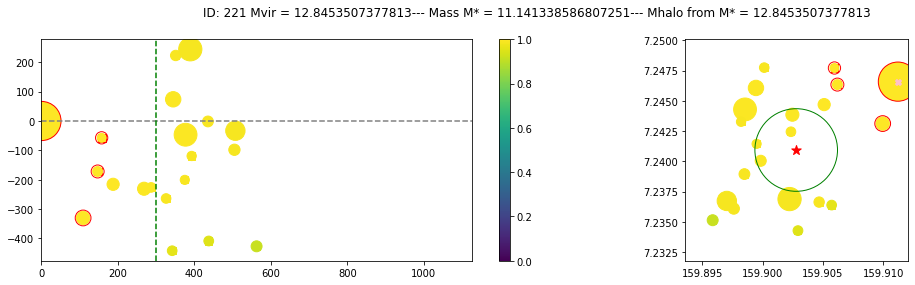

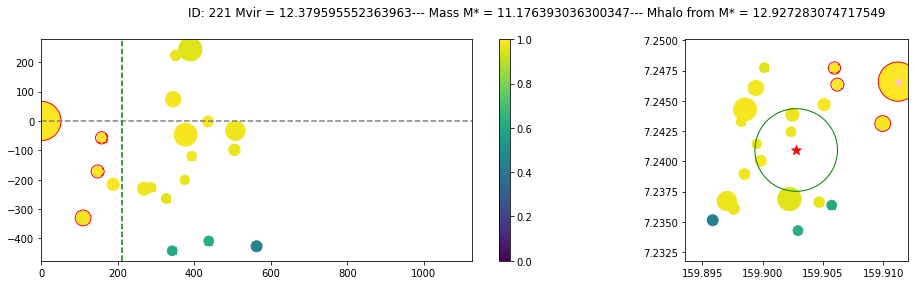

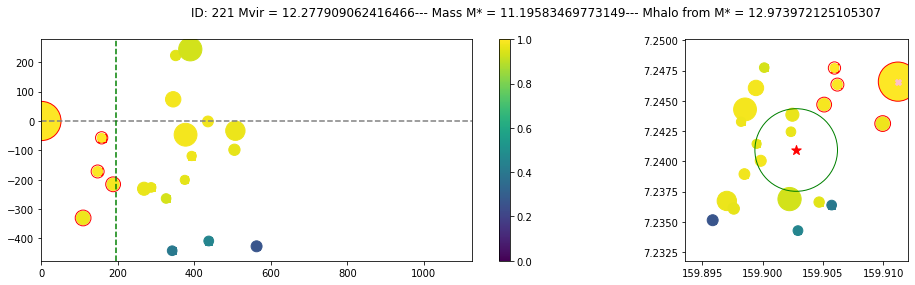

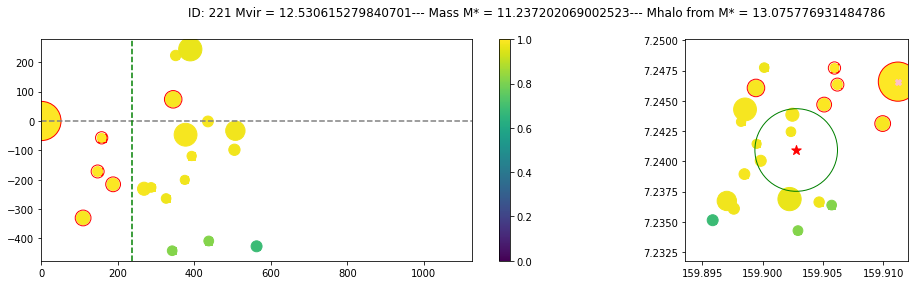

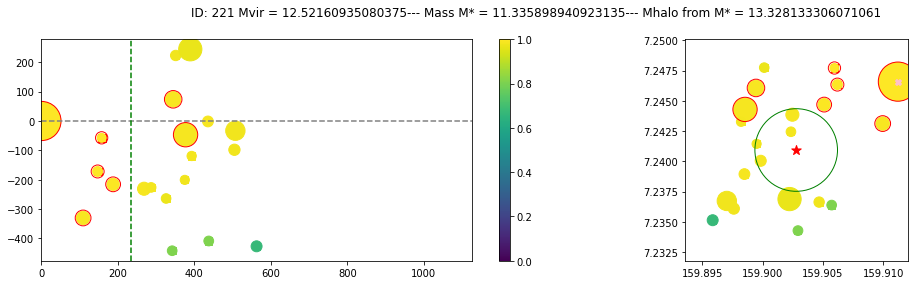

...

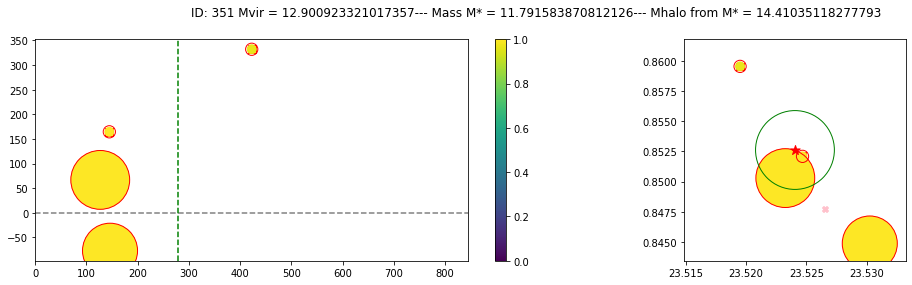

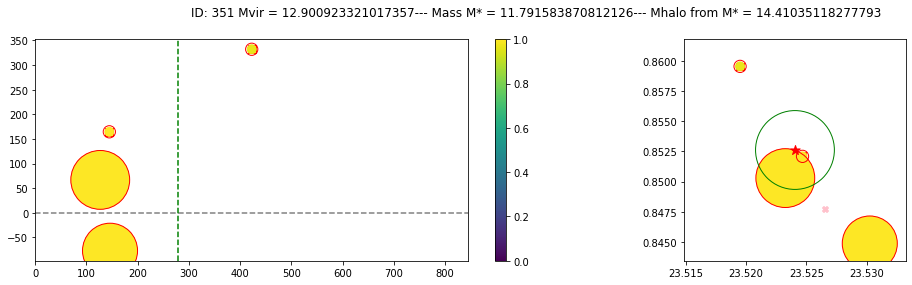

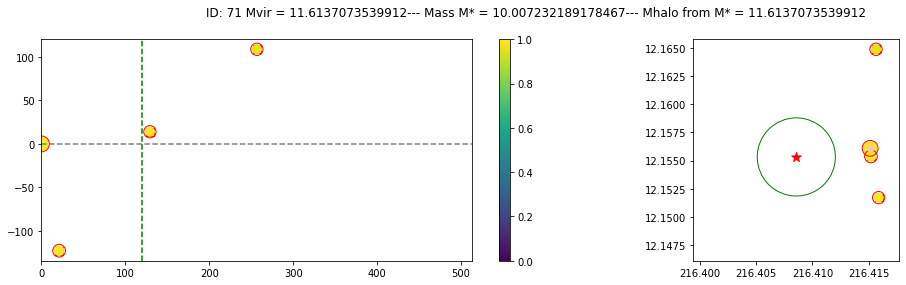

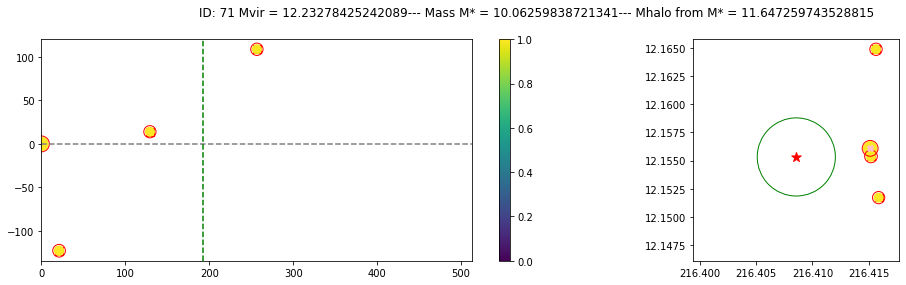

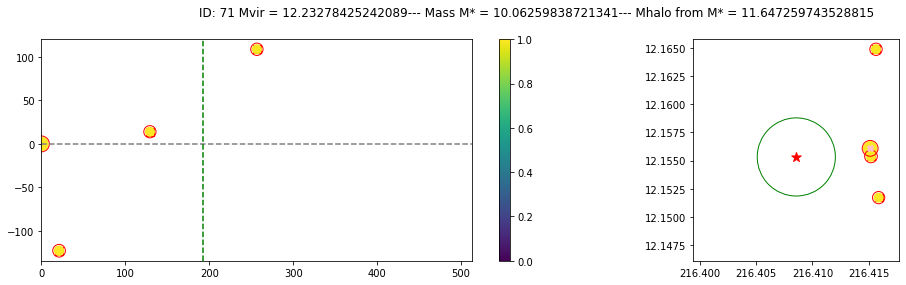

In [773]:
G_hom, R_hom = gt.hod_refinement_2(G_hom, R_hom, N = 4)

In [37]:
#R_hom.to_csv("R_hom_manuscript.csv", index = False)
#G_hom.to_csv("G_hom_manuscript.csv", index = False)
R_hom = pd.read_csv("R_hom_manuscript.csv", index_col = False)
G_hom = pd.read_csv("G_hom_manuscript.csv", index_col = False)

In [38]:
R_hom["outlier"] = R_hom["Psat"].apply(lambda x : not bool(np.round(x)))

In [39]:
G_final = gt.get_groups(R_hom, N_min = 1)
G4_final = gt.get_groups(R_hom, N_min = 4)
G3_final = gt.get_groups(R_hom, N_min = 3)
G5_final = gt.get_groups(R_hom, N_min = 5)
len(G_final)

/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mass10"] = 10**df["sed_logMass"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["ra_mass"] = df["RA"]*df["mass10"]
/home/mcherrey/ownCloud/git_groups/Phd_groups/groups_tools.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inst

515

In [42]:
G_final = gt.calc_mass_ratio(G_final, R_hom)
G_final = gt.recompute_centers_new(G_final, R_hom)

In [43]:
R_final, G_final = gt.calc_mass(R_hom, G_final, N_lim = 3)

In [44]:
print("N of group of more than 3 galaxies: ", len(G3_final))
print("N of group of more than 4 galaxies: ", len(G4_final))
print("N of group of more than 5 galaxies: ", len(G5_final))

N of group of more than 3 galaxies:  94
N of group of more than 4 galaxies:  42
N of group of more than 5 galaxies:  24


In [45]:
R_final = gt.match_qso(R_final, fields_info)

In [46]:
G_final = gt.create_id(G_final, "N_gal")

**Now we count in each group how many galaxies of logM*>9 there is** (to apply our volume limited selection criterion):

In [47]:
k1 = R_final["group_id"] == 348
k2 = R_final["sed_logMass"] >=9
k3 = R_final["outlier"] == False
rr_9 = R_final[k1 & k2 & k3]
len(rr_9)

2

In [48]:
N_gal_9 = []
for i, g in G_final.iterrows():
    k1 = R_final["group_id"] == g["group_id"]
    k2 = R_final["sed_logMass"] >=9
    k3 = R_final["outlier"] == False
    rr_9 = R_final[k1 & k2 & k3]
    N_gal_9.append(len(rr_9))
    #print(len(rr_9))
    #print(g["group_id"], N_gal_9)
N_gal_9 = np.array(N_gal_9)
G_final["N_gal_9"] = N_gal_9

In [49]:
ggg = G_final[G_final["group_id"] == 348]
ggg["N_gal_9"]

52    2
Name: N_gal_9, dtype: int64

In [50]:
f1 = G_final["Mvir_sigma2"]>=1e12
f2 = G_final["Mvir_sigma2"]>=1e13
f3 = G_final["center_z"]>=0.3
f4 = G_final["center_z"]<=1.5
print("Number of groups with mass above 1e12 Msun: ", len(G_final[f1 & f3 & f4]))
print("Number of groups with mass above 1e13 Msun: ", len(G_final[f2 & f3 & f4]))

Number of groups with mass above 1e12 Msun:  58
Number of groups with mass above 1e13 Msun:  12


In [51]:
G_final = gt.match_qso(G_final, fields_info)
len(G_final["group_id"])

515

In [52]:
ra0 = G_final["center_ra"]*u.degree
ra1 = G_final["mean_ra"]*u.degree
ra2 = G_final["ra_qso"]*u.degree
dec0 = G_final["center_dec"]*u.degree
dec1 = G_final["mean_dec"]*u.degree
dec2 = G_final["dec_qso"]*u.degree
c0 = SkyCoord(ra0, dec0)
c1 = SkyCoord(ra1, dec1)
c2 = SkyCoord(ra2, dec2)
sep0 = c0.separation(c2)
sep1 = c1.separation(c2)
G_final["dist"] = Distance(unit=u.kpc, z = G_final["center_z"]).value/((1+G_final["center_z"])**2)
G_final["b_center_kpc"] = sep0.radian*G_final["dist"]
G_final["b_geomcenter_kpc"] = sep1.radian*G_final["dist"]
G_final = G_final.astype({"b_center_kpc":"float"})
G_final = G_final.astype({"b_geomcenter_kpc":"float"})

In [53]:
G_final = gt.b_center_error(G_final)

In [54]:
G_final["b_min_kpc_norm2"] = G_final["b_min_kpc"]/G_final["Rvir_sigma2"] 
G_final["b_center_kpc_norm2"] = G_final["b_center_kpc"]/G_final["Rvir_sigma2"] 
G_final["b_geomcenter_kpc_norm2"] = G_final["b_geomcenter_kpc"]/G_final["Rvir_sigma2"]

G_final["b_min_kpc_norm2_err"] =  G_final["b_min_kpc_norm2"] * G_final["Rvir_sigma2_error"]/G_final["Rvir_sigma2"] 
G_final["b_center_kpc_norm2_err"] = G_final["b_center_err"]/G_final["Rvir_sigma2"] + G_final["b_center_kpc_norm2"] * G_final["Rvir_sigma2_error"]/G_final["Rvir_sigma2"] 
G_final["b_geomcenter_kpc_norm2_err"] = G_final["b_geomcenter_kpc_norm2"]* G_final["Rvir_sigma2_error"]/G_final["Rvir_sigma2"]

G_final["b_min_kpc_norm3"] = G_final["b_min_kpc"]/G_final["Rvir_sigma3"] 
G_final["b_center_kpc_norm3"] = G_final["b_center_kpc"]/G_final["Rvir_sigma3"] 
G_final["b_geomcenter_kpc_norm3"] = G_final["b_geomcenter_kpc"]/G_final["Rvir_sigma3"]

G_final["b_min_kpc_norm3_err"] = G_final["b_min_kpc_norm3"] * G_final["Rvir_sigma3_error"]/G_final["Rvir_sigma3"] 
G_final["b_center_kpc_norm3_err"] = G_final["b_center_err"]/G_final["Rvir_sigma2"] + G_final["b_center_kpc_norm3"] * G_final["Rvir_sigma3_error"]/G_final["Rvir_sigma3"] 
G_final["b_geomcenter_kpc_norm3_err"] = G_final["b_geomcenter_kpc_norm3"]* G_final["Rvir_sigma3_error"]/G_final["Rvir_sigma3"]


In [55]:
G_final["QSO_is_behind"] = G_final["mean_z"] <= G_final["zqso_sdss"] - 3e6/const.c.value

In [56]:
R_final["detection_limit"] = 0.1/(1+R_final["Z"])
G_final["detection_limit"] = 0.1/(1+G_final["center_z"])

In [57]:
Abs = gt.get_N100_abs(Abs, R_final, dv = 0.5e6)
Abs2 = gt.get_Nxxx_abs(Abs, R_final, bmax = 2000, dv = 0.5e6)
Abs3 = gt.get_Nxxx_abs_test(Abs, R_final, bmax = 100, dv = 0.5e6)
Abs4 = gt.get_Nxxx_abs_test(Abs, R_final, bmax = 2000, dv = 0.5e6)
Abs5 = gt.get_Nxxx_abs(Abs, R_final, bmax = 250, dv = 0.5e6)

In [58]:
cov_table = pd.read_csv("group_abs_coverage_table.csv")

In [59]:
dz = 0.5e6/const.c.value
grp_id = []
for i, c in cov_table.iterrows():
    f = c["field_id"]
    z = c["mean_z"]
    k1 = G_final["field_id"] == f
    k2 = G_final["mean_z"].between(z-dz, z+dz)
    match = G_final[k1 & k2]
    if len(match) == 1:
        grp_id.append(float(match["group_id"].values))
    else:
        grp_id.append(-1)
    #print(len(match))
cov_table["group_id"] = np.array(grp_id)

In [60]:
ggg = G_final[G_final["group_id"] == 348]
ggg["N_gal_9"]

52    2
Name: N_gal_9, dtype: int64

In [61]:
cov_table_trunc = cov_table[["group_id","FeII_2374_lim", "FeII_2600_lim", "MgII_2796_lim", "MgII_2803_lim", "MgI_2852_lim"]]
cov_table_trunc.drop_duplicates(subset ="group_id",keep = False, inplace = True)
G_final = G_final.merge(cov_table_trunc, on = "group_id", how = "left")

In [62]:
f1 = G_final["Mvir_sigma2"]>=1e12
f2 = G_final["Mvir_sigma2"]>=1e13
f3 = G_final["mean_z"]>=0.3
f4 = G_final["mean_z"]<=1.5
f5 = G_final["N_gal_9"]>=4
f6 = G_final["N_gal"]>=4
f7 = G_final["N_gal"]>=5
print("Number of groups with N(logM*>9)>=4 ", len(G_final[f3 & f4 & f5]))
print("Number of groups with N >= 4 ", len(G_final[f3 & f4 & f6]))
print("Number of groups with N >= 5 ", len(G_final[f3 & f4 & f7]))
print("Number of groups with mass above 1e13 Msun: ", len(G_final[f2 & f3 & f4 & f5]))

Number of groups with N(logM*>9)>=4  25
Number of groups with N >= 4  42
Number of groups with N >= 5  24
Number of groups with mass above 1e13 Msun:  5


In [63]:
G_final = gt.match_absorptions(G_final, Abs, dv = 1e6)
R_final = gt.match_absorptions_isolated_galaxies(R_final, Abs, dv = 0.5e6)

In [64]:
G = G_final.copy()
R = R_final.copy()

f5 = G["N_gal"] == 1
f6 = G["N_gal"]  > 1
#f7 = G["N100_los"] > 1
f8 = G["bool_absorption"] == 1
f_N_5 = G["N_gal"] >= 5
f_N_4 = G["N_gal"] >= 4
f_N_3 = G["N_gal"] >= 3
f_N9_5 = G["N_gal_9"] >= 5
f_N9_4 = G["N_gal_9"] >= 4
f_N9_3 = G["N_gal_9"] >= 3
f10 = G["bool_absorption"] == 0
f11 = G["N_gal"] >= 2
f12 = G["MgII_2796_lim"] == np.inf
f13 = G["MgII_2796_lim"] != np.inf
f14 = G["QSO_is_behind"] == True
#f24 = G["ID"].isin(good_grp)

f15 = R["B_KPC"] <= 100
#f16 = R["N100_los"] <= 2
#f17 = R["N100_los"] <= 1
f18 = R["N50_neighb"] == 0
f19 = R["Z"] >= 4700/2796 - 1
f20 = R["Z"] <= 9300/2796 - 1
f21 = R["bool_absorption"] == 0
f22 = R["bool_absorption"] == 1
f23 = R["B_KPC"]>= 5 # remove the QSOs
#fweirds = G["Rvir_recomputed"] >= 10

In [65]:
G_abs = G[f8 & f14 & f13]
G_noabs = G[f10 & f14 & f13]
#G2 = G[f7 & f13 & f14]
#G2_abs = G[f8 & f7 & f14 & f13]
#G2_noabs = G[f10 & f7 & f14 & f13]
G5 = G[f_N_5 & f13 & f14]
G5_abs = G5[G5["bool_absorption"] == 1]
G5_noabs = G5[G5["bool_absorption"] == 0]
G4_nocov = G[f_N_4 & ~f13]
G4_nobehind = G[f_N_4 & ~f14]
G4_raw = G[f_N_4]
G4 = G[f_N_4 & f13 & f14]
G4_abs = G4[G4["bool_absorption"] == 1]
G4_noabs = G4[G4["bool_absorption"] == 0]
G3 = G[f_N_3 & f13 & f14]
G3_abs = G4[G4["bool_absorption"] == 1]
G3_noabs = G4[G4["bool_absorption"] == 0]


G5_9 = G[f_N9_5 & f13 & f14]
G5_9_abs = G5_9[G5_9["bool_absorption"] == 1]
G5_9_noabs = G5_9[G5_9["bool_absorption"] == 0]
G4_9 = G[f_N9_4 & f13 & f14]
G4_9_abs = G4_9[G4_9["bool_absorption"] == 1]
G4_9_noabs = G4_9[G4_9["bool_absorption"] == 0]
G3_9 = G[f_N9_3 & f13 & f14]
G3_9_abs = G3_9[G3_9["bool_absorption"] == 1]
G3_9_noabs = G3_9[G3_9["bool_absorption"] == 0]

#R_ilane_abs = R[f22 & f15 & f17 & f18 & f23]
#R_ilane_noabs = R[f21 & f15 & f17 & f18  & f23]
#R_ilane2_abs = R[f22 & f17 & f18  & f23]
#R_ilane2_noabs = R[f21 & f17 & f18  & f23]

In [66]:
print("nb of groups of more than 3 gal: ", len(G3))
print("nb of groups of more than 4 gal: ", len(G4))
print("nb of groups of more than 4 gal raw: ", len(G4_raw))
print("nb of groups of more than 4 gal with no coverage: ", len(G4_nocov))
print("nb of groups of more than 4 gal not behind qso: ", len(G4_nobehind))
print("nb of groups of more than 5 gal: ", len(G5))

print("nb of groups of more than 3 gal with logM*>9: ", len(G3_9))
print("nb of groups of more than 4 gal with logM*>9: ", len(G4_9))
print("nb of groups of more than 5 gal with logM*>9: ", len(G5_9))

nb of groups of more than 3 gal:  83
nb of groups of more than 4 gal:  36
nb of groups of more than 4 gal raw:  42
nb of groups of more than 4 gal with no coverage:  3
nb of groups of more than 4 gal not behind qso:  3
nb of groups of more than 5 gal:  21
nb of groups of more than 3 gal with logM*>9:  36
nb of groups of more than 4 gal with logM*>9:  22
nb of groups of more than 5 gal with logM*>9:  9


In [69]:
G4_nobehind[["mean_z", "zqso_sdss"]]

,mean_z,zqso_sdss
1,0.937678,0.938
38,0.872675,0.875
40,1.36068,0.875


(10.0, 15.0)

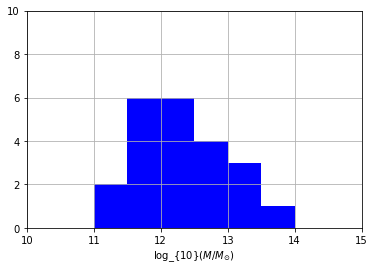

In [803]:
plt.hist(np.log10(G4_9["Mvir_sigma2"]), bins = 9, range = (10,14.5), color = 'blue');
plt.xlabel("log_{10}($M/M_{\odot}$)")
plt.grid()
plt.ylim((0,10))
plt.xlim((10,15))

In [804]:
print("min mass = ", np.min(np.log10(G4["Mvir_sigma2"])), "max mass = ", np.max(np.log10(G4["Mvir_sigma2"])))

min mass =  10.860103257472842 max mass =  13.751604211988976


In [805]:
print("median mass = ", np.median(np.log10(G4["Mvir_sigma2"])))

median mass =  12.215633873209153


In [806]:
print("min mass = ", np.min(G4["mean_z"]), "max mass = ", np.max(G4["mean_z"]))

min mass =  0.46440666666666663 max mass =  1.4321199999999998


In [807]:
print("median mass = ", np.median(G4["mean_z"]))

median mass =  0.91833375


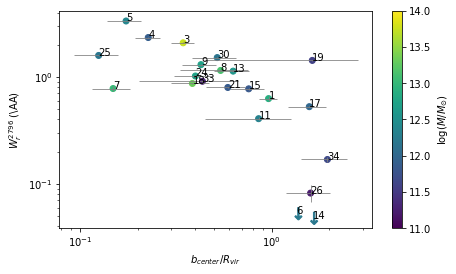

In [808]:
plt.figure(figsize = (7,4))
#plt.title("FoF groups ($N >= 5$)")
plt.errorbar(G4_9_abs["b_center_kpc_norm2"], G4_9_abs["REW_2796"], xerr = G4_9_abs["b_center_kpc_norm2_err"], \
             yerr = G4_9_abs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G4_9_abs["b_center_kpc_norm2"], G4_9_abs["REW_2796"], marker = "o", label = "groups N >= 5",\
            c = np.log10(G4_9_abs["Mvir_sigma2"]), vmin = 11, vmax = 14)
plt.colorbar(label = "log($M/M_{\odot}$)")
plt.errorbar(G4_9_noabs["b_center_kpc_norm2"], G4_9_noabs["REW_2796"], xerr = G4_9_noabs["b_center_kpc_norm2_err"],\
             yerr = G4_9_noabs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G4_9_noabs["b_center_kpc_norm2"], G4_9_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c = np.log10(G4_9_noabs["Mvir_sigma2"]),vmin = 11, vmax = 14)

X = np.array(G4_9_abs["b_center_kpc_norm2"])
Y = np.array(G4_9_abs["REW_2796"])
txt = np.array(G4_9_abs["ID"])

for i in range(len(G4_9_abs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))
    
X = np.array(G4_9_noabs["b_center_kpc_norm2"])
Y = np.array(G4_9_noabs["detection_limit"])
txt = np.array(G4_9_noabs["ID"])

for i in range(len(G4_9_noabs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))


plt.xlabel("$b_{center}/R_{vir}$")
plt.ylabel("$W_r^{2796}$ (\AA)")
#plt.grid()
plt.xscale("log")
plt.yscale("log")
#plt.xlim((0.1,5))

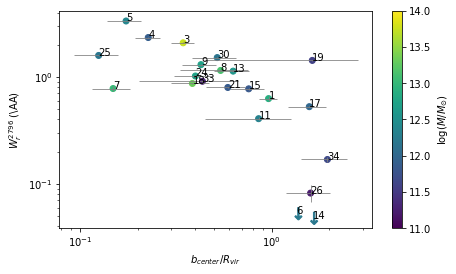

In [813]:
plt.figure(figsize = (7,4))
#plt.title("FoF groups ($N >= 5$)")
plt.errorbar(G4_9_abs["b_center_kpc_norm2"], G4_9_abs["REW_2796"], xerr = G4_9_abs["b_center_kpc_norm2_err"], \
             yerr = G4_9_abs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G4_9_abs["b_center_kpc_norm2"], G4_9_abs["REW_2796"], marker = "o", label = "groups N >= 5",\
            c = np.log10(G4_9_abs["Mvir_sigma2"]), vmin = 11, vmax = 14)
plt.colorbar(label = "log($M/M_{\odot}$)")
plt.errorbar(G4_9_noabs["b_center_kpc_norm2"], G4_9_noabs["REW_2796"], xerr = G4_9_noabs["b_center_kpc_norm2_err"],\
             yerr = G4_9_noabs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G4_9_noabs["b_center_kpc_norm2"], G4_9_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c = np.log10(G4_9_noabs["Mvir_sigma2"]),vmin = 11, vmax = 14)

X = np.array(G4_9_abs["b_center_kpc_norm2"])
Y = np.array(G4_9_abs["REW_2796"])
txt = np.array(G4_9_abs["ID"])

for i in range(len(G4_9_abs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))
    
X = np.array(G4_9_noabs["b_center_kpc_norm2"])
Y = np.array(G4_9_noabs["detection_limit"])
txt = np.array(G4_9_noabs["ID"])

for i in range(len(G4_9_noabs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))


plt.xlabel("$b_{center}/R_{vir}$")
plt.ylabel("$W_r^{2796}$ (\AA)")
#plt.grid()
plt.xscale("log")
plt.yscale("log")
#plt.xlim((0.1,5))

Text(0, 0.5, '$W_r^{2796}$ (\\AA)')

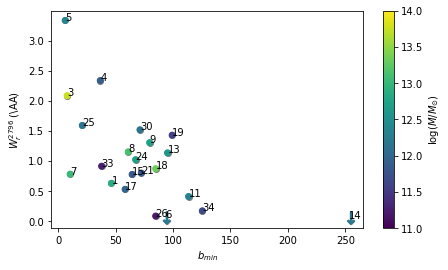

In [814]:
plt.figure(figsize = (7,4))
#plt.title("FoF groups ($N >= 5$)")
plt.scatter(G4_9_abs["b_min_kpc"], G4_9_abs["REW_2796"], marker = "o", label = "groups N >= 5",\
            c = "grey")
plt.scatter(G4_9_abs["b_min_kpc"], G4_9_abs["REW_2796"], marker = "o", label = "groups N >= 5",\
            c = np.log10(G4_9_abs["Mvir_sigma2"]), vmin = 11, vmax = 14)
plt.colorbar(label = "log($M/M_{\odot}$)")
plt.scatter(G4_9_noabs["b_min_kpc"], G4_9_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c ="grey")
plt.scatter(G4_9_noabs["b_min_kpc"], G4_9_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c = np.log10(G4_9_noabs["Mvir_sigma2"]),vmin = 11, vmax = 14)

X = np.array(G4_9_abs["b_min_kpc"])
Y = np.array(G4_9_abs["REW_2796"])
txt = np.array(G4_9_abs["ID"])

for i in range(len(G4_9_abs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))
    
X = np.array(G4_9_noabs["b_min_kpc"])
Y = np.array(G4_9_noabs["detection_limit"])
txt = np.array(G4_9_noabs["ID"])

for i in range(len(G4_9_noabs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))


plt.xlabel("$b_{min}$")
plt.ylabel("$W_r^{2796}$ (\AA)")
#plt.grid()
#plt.xscale("log")
#plt.yscale("log")
#plt.xlim((0.1,5))

Text(0, 0.5, '$W_r^{2796}$ (\\AA)')

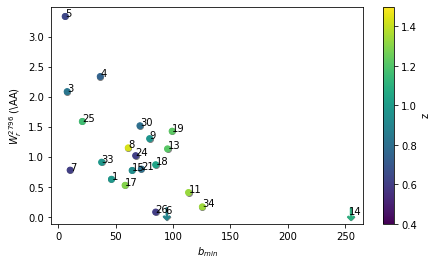

In [821]:
plt.figure(figsize = (7,4))
#plt.title("FoF groups ($N >= 5$)")
plt.scatter(G4_9_abs["b_min_kpc"], G4_9_abs["REW_2796"], marker = "o", label = "groups N >= 5",\
            c = "grey")
plt.scatter(G4_9_abs["b_min_kpc"], G4_9_abs["REW_2796"], marker = "o", label = "groups N >= 5",\
            c = G4_9_abs["mean_z"], vmin = 0.4, vmax = 1.5)
plt.colorbar(label = "z")
plt.scatter(G4_9_noabs["b_min_kpc"], G4_9_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c ="grey")
plt.scatter(G4_9_noabs["b_min_kpc"], G4_9_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c = G4_9_noabs["mean_z"],vmin = 0.4, vmax = 1.5)

X = np.array(G4_9_abs["b_min_kpc"])
Y = np.array(G4_9_abs["REW_2796"])
txt = np.array(G4_9_abs["ID"])

for i in range(len(G4_9_abs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))
    
X = np.array(G4_9_noabs["b_min_kpc"])
Y = np.array(G4_9_noabs["detection_limit"])
txt = np.array(G4_9_noabs["ID"])

for i in range(len(G4_9_noabs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))


plt.xlabel("$b_{min}$")
plt.ylabel("$W_r^{2796}$ (\AA)")
#plt.grid()
#plt.xscale("log")
#plt.yscale("log")
#plt.xlim((0.1,5))

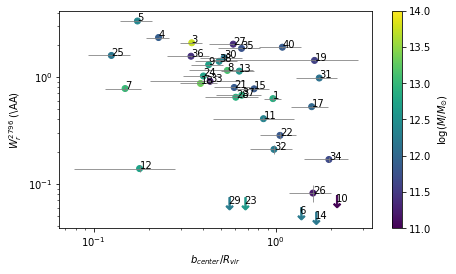

In [816]:
plt.figure(figsize = (7,4))
#plt.title("FoF groups ($N >= 5$)")
plt.errorbar(G4_abs["b_center_kpc_norm2"], G4_abs["REW_2796"], xerr = G4_abs["b_center_kpc_norm2_err"], \
             yerr = G4_abs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G4_abs["b_center_kpc_norm2"], G4_abs["REW_2796"], marker = "o", label = "groups N >= 5",\
            c = np.log10(G4_abs["Mvir_sigma2"]), vmin = 11, vmax = 14)
plt.colorbar(label = "log($M/M_{\odot}$)")
plt.errorbar(G4_noabs["b_center_kpc_norm2"], G4_noabs["REW_2796"], xerr = G4_noabs["b_center_kpc_norm2_err"],\
             yerr = G4_noabs["sig_REW_2796"],\
             fmt = 'none',c = "gray", linewidth = 0.8)
plt.scatter(G4_noabs["b_center_kpc_norm2"], G4_noabs["detection_limit"], marker = "$\downarrow$", s = 150,\
            label = "groups N >= 5", c = np.log10(G4_noabs["Mvir_sigma2"]),vmin = 11, vmax = 14)

X = np.array(G4_abs["b_center_kpc_norm2"])
Y = np.array(G4_abs["REW_2796"])
txt = np.array(G4_abs["ID"])

for i in range(len(G4_abs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))
    
X = np.array(G4_noabs["b_center_kpc_norm2"])
Y = np.array(G4_noabs["detection_limit"])
txt = np.array(G4_noabs["ID"])

for i in range(len(G4_noabs)):
    plt.annotate(str(txt[i]), (X[i], Y[i]))


plt.xlabel("$b_{center}/R_{vir}$")
plt.ylabel("$W_r^{2796}$ (\AA)")
#plt.grid()
plt.xscale("log")
plt.yscale("log")
#plt.xlim((0.1,5))

# export

In [817]:
R_final.to_csv("R_final_manuscript.csv", index = False)
G_final.to_csv("G_final_manuscript.csv", index = False)